In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import ast
import csv
import collections
from dython import examples, nominal
from itertools import chain, cycle
import krippendorff_alpha as k
import math
import matplotlib.pyplot as plt
import os
import pandas as pd
import pickle 
import numpy as np
import random
import researchpy as rp
import scipy.stats as ss
import spacy
from sklearn import preprocessing
import re


from sklearn.feature_extraction.text import CountVectorizer

pd.options.display.max_rows = 1000
pd.options.display.max_columns = 35
pd.options.display.max_colwidth = 800

np.random.seed(1234)
random.seed(1234)

from matplotlib import rc
#rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
rc('font',**{'family':'serif','serif':['Times'],'size':12})
#rcParams['font.size'] = 12
#rc('text', usetex=True)

In [119]:
# read aggregated file
gold_file = '../../data/gold/with_features_annotated_questions_responses_gold.tsv'
gold_df = pd.read_csv(gold_file, index_col=False, sep='\t')

In [120]:
# convert string columns back to tuples
columns = ['gold_label_set', 'gold_act_set', 'gold_acts','gold_intents','gold_intents_binary', 'gold_intent_set','gold_coarse_labels', 'gold_fine_labels', 
           'gold_workers', 'gold_sentiments', 'gold_explanations',
           'gold_q_intents', 'gold_q_sentiments',
           'gold_work_times', 'gold_assignment_ids', 'gold_hit_ids', 'coarse_labels', 'fine_labels',
           'workers', 'sentiments', 'explanations']
for column in columns:
    gold_df[column] = [ast.literal_eval(x) for x in gold_df[column]]

In [39]:
# read per annotator file
expanded_file = '../../data/gold/expanded_with_features_annotated_questions_responses_gold.csv'
expanded_df = pd.read_csv(expanded_file, index_col=False)

In [6]:
def plot_freqs_counts_dict(counts_dict, plot_title, label_order, colors, y_lim=1.0, hide_x_labels=False):
    fig, ax = plt.subplots()
    subplot_freqs_counts(counts_dict, ax, plot_title, label_order, colors, y_lim, hide_x_labels)
    plt.show()
    
def plot_freqs_counts_overall(df, column, label_order, colors, y_lim=0.8, hide_x_labels=True):
    counts_dict = collections.Counter(list(chain.from_iterable(df[column].values)))
    fig, ax = plt.subplots()
    subplot_freqs_counts(counts_dict, ax, 'All Hearings', label_order, colors, y_lim, hide_x_labels)
    plt.show()
    
def plot_freqs_counts(df, column, label_order, colors, y_lim=0.8, hide_x_labels=True):
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        counts_dict = collections.Counter(list(chain.from_iterable(group[column].values)))
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        subplot_freqs_counts(counts_dict, axes[row_idx, col_idx], plot_title, label_order, colors, y_lim, hide_x_labels)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()
    
def subplot_freqs_counts(counts_dict, ax, plot_title, label_order, colors, y_lim, hide_x_labels):
    label_counts_ordered = {}
    for label in label_order:
        if label in counts_dict:
            label_counts_ordered[label]=counts_dict[label]
        else:
            label_counts_ordered[label]=0
    freqs = [val/sum(counts_dict.values()) for val in label_counts_ordered.values()]
    print(plot_title)
    print(freqs)
    ax.set_ylim(0, y_lim)
    if hide_x_labels:
        ax.set_xticklabels([])
    else:
        plt.setp(ax.get_xticklabels(), rotation=90)
    ax.set_title(plot_title)
    rects=ax.bar(label_counts_ordered.keys(), freqs, color=colors)
    ax.set_ylabel('Frequency')
    for rect, label in zip(rects, label_counts_ordered.values()):
        height = rect.get_height()
        if label != 0:
            ax.text(rect.get_x() + rect.get_width() / 2, 1.05*height, 
                        label, 
                        ha='center', va='bottom')
            
def subplot_freqs_counts_stacked(counts_dict, ax, plot_title, label_order, colors, y_lim, hide_x_labels):
    label_counts_ordered = {}
    for label in label_order:
        if label in counts_dict:
            label_counts_ordered[label]=counts_dict[label]
        else:
            label_counts_ordered[label]=0
    freqs = [val/sum(counts_dict.values()) for val in label_counts_ordered.values()]
    
    ax.set_ylim(0, y_lim)
    if hide_x_labels:
        ax.set_xticklabels([])
    else:
        plt.setp(ax.get_xticklabels(), rotation=90)
    ax.set_title(plot_title)
    label_names = list(label_counts_ordered.keys())
    rect1 = ax.bar(label_names[0], freqs[0], color=colors[0], width=0.5)
    rect2 = ax.bar(label_names[1], freqs[1], color=colors[1], width=0.5)
    rect3 = ax.bar(label_names[1], freqs[2], color=colors[2], bottom=freqs[1], width=0.5)
    ax.set_ylabel('Frequency')
    rects = ax.patches
    label_values = list(label_counts_ordered.values())
    
    height1 = rects[0].get_height()
    height2 = rects[1].get_height()
    height3 = rects[2].get_height()
    ax.text(rects[0].get_x() + rects[0].get_width() / 2, 1.05*height1, 
                        label_values[0], 
                        ha='center', va='bottom')
    ax.text(rects[2].get_x() + rects[2].get_width() / 2, 1.05*(height2+height3), 
                        label_values[1]+label_values[2], 
                        ha='center', va='bottom')
    
    ax.text(rects[1].get_x()-0.07, rects[1].get_y(), 
                        label_values[1], 
                        ha='center', va='bottom')
    ax.text(rects[2].get_x()-0.07, rects[2].get_y(),
                        label_values[2], 
                        ha='center', va='bottom')
    
    
    height2 = rects[0].get_height()

# For dataframes
def plot_freqs_counts_df_overall(df, column, label_order, colors, y_lim=0.65, hide_x_labels=True):
    fig, ax = plt.subplots()
    subplot_freqs_counts_df(ax, df, column, 'All Hearings', label_order, colors, y_lim, hide_x_labels)
    plt.show()
    
def plot_freqs_counts_df(df, column, label_order, colors, y_lim=0.65, hide_x_labels=True):
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        subplot_freqs_counts_df(axes[row_idx, col_idx], group, column, plot_title, label_order, colors, y_lim, hide_x_labels)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()
    
def subplot_freqs_counts_df(ax, df, column, plot_title, label_order, colors, y_lim, hide_x_labels):
    label_set_counts_ordered = {}
    label_set_counts = df[column].value_counts()
    for label in label_order:
        if label in df[column].value_counts():
            label_set_counts_ordered[str(label)]=label_set_counts[label]
        else:
            label_set_counts_ordered[str(label)]=0
    freqs = [val/len(df) for val in label_set_counts_ordered.values()]
    ax.set_ylim(0, y_lim)
    if hide_x_labels:
        ax.set_xticklabels([])
    else:
        plt.setp(ax.get_xticklabels(), rotation=90)
    ax.set_title(plot_title)
    rects=ax.bar(label_set_counts_ordered.keys(), freqs, color=colors)
    ax.set_ylabel('Frequency')
    for rect, label in zip(rects, label_set_counts_ordered.values()):
        height = rect.get_height()
        if label != 0:
            ax.text(rect.get_x() + rect.get_width() / 2, 1.05*height, 
                        label, 
                        ha='center', va='bottom')

def plot_disagreement_time(df, column):
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        subplot_disagreement_time(axes[row_idx, col_idx], group, column, plot_title)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()
    
def subplot_disagreement_time(ax, df, column, plot_title):
    ax.set_yticklabels(range(0,4))
    ax.set_title(plot_title)
    ax.set_ylabel('Number of labels')
    y = [len(labels) for labels in df[column].values]
    x = range(1,51)
    ax.plot(x,y,marker='o', linestyle=':')

## Q0: What is the overall label set distribution?

In [7]:
colors = plt.get_cmap('tab10').colors

#label order
label_order = ['answer', 'answer_overans-sway', 'shift-dodge', 'shift-correct', 'cant-answer-lying', 'cant-answer-sincere']
# label colors
color_iter = cycle(colors)
label_colors = []
for i in range(len(label_order)):
    label_colors.append(next(color_iter))
    
#label set order
label_set_order = gold_df['gold_label_set'].value_counts(sort=True).index
#label set colors
color_iter = cycle(colors)
label_set_colors = []
for i in range(len(label_set_order)):
    label_set_colors.append(next(color_iter))

### Individual labels

All Hearings
[0.5668707702223654, 0.03206574282951982, 0.20335159523042218, 0.0825008056719304, 0.036899774411859494, 0.07831131163390267]


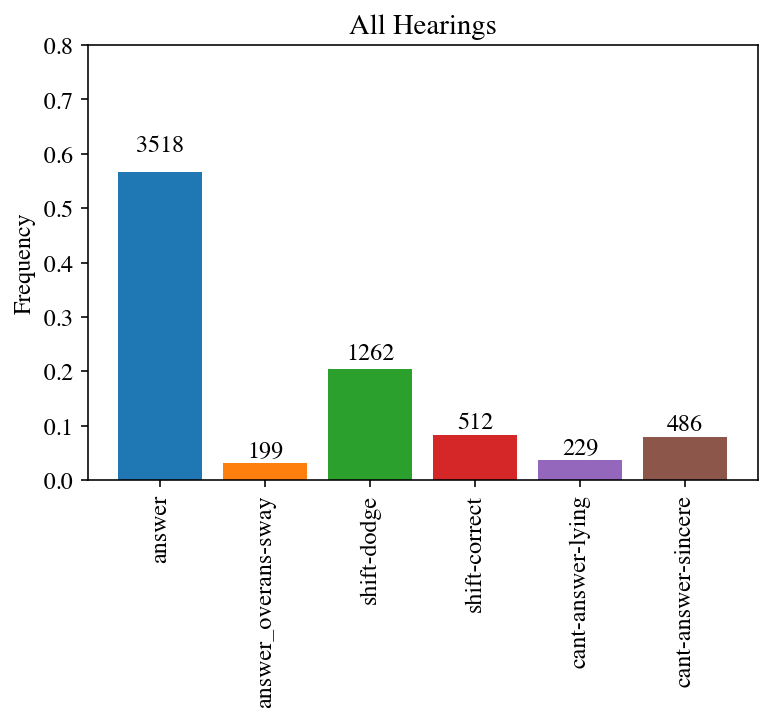

In [8]:
plot_freqs_counts_overall(gold_df, 'gold_coarse_labels', label_order, label_colors, hide_x_labels=False)

86195:Examining the IRS's 
[0.5888157894736842, 0.01644736842105263, 0.1611842105263158, 0.09539473684210527, 0.049342105263157895, 0.08881578947368421]
88494:Examining the Irs Re
[0.6394984326018809, 0.03134796238244514, 0.14106583072100312, 0.08463949843260188, 0.025078369905956112, 0.07836990595611286]
89598:IRS Obstruction: Loi
[0.7657657657657657, 0.04504504504504504, 0.09309309309309309, 0.057057057057057055, 0.009009009009009009, 0.03003003003003003]
93834:Examining The Justic
[0.7484472049689441, 0.0, 0.10248447204968944, 0.059006211180124224, 0.031055900621118012, 0.059006211180124224]
20722:Oversight of the Dep
[0.4, 0.020338983050847456, 0.3016949152542373, 0.13220338983050847, 0.013559322033898305, 0.13220338983050847]
22125:Oversight of the Fed
[0.5226480836236934, 0.013937282229965157, 0.06620209059233449, 0.05574912891986063, 0.11149825783972125, 0.22996515679442509]
26003:Holding Wall Street 
[0.3903225806451613, 0.08387096774193549, 0.4129032258064516, 0.04193548387096

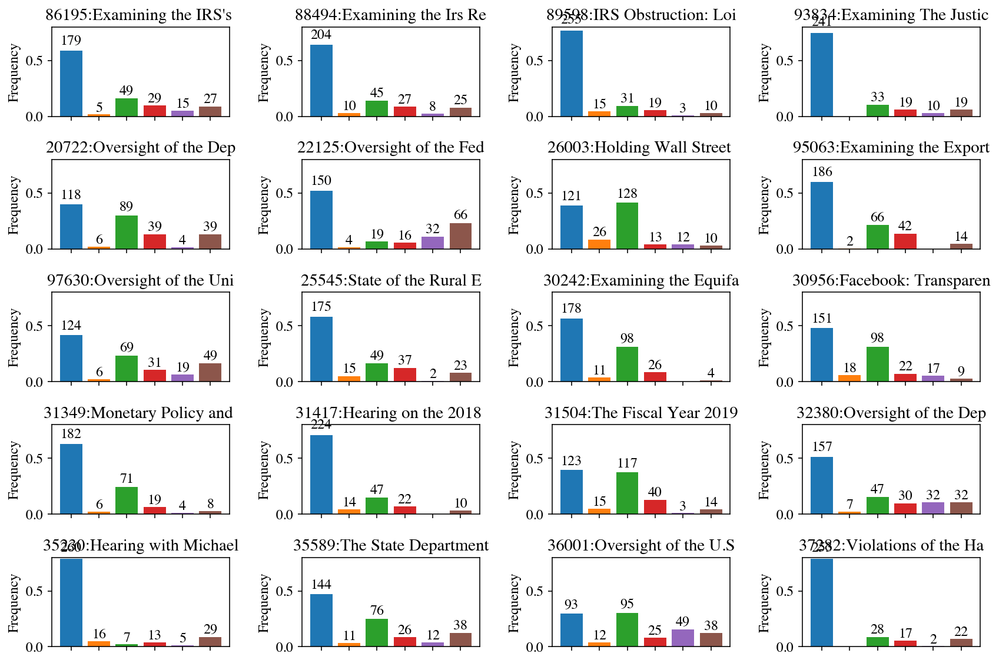

In [9]:
plot_freqs_counts(gold_df, 'gold_coarse_labels', label_order, label_colors, hide_x_labels=True)

### Label sets

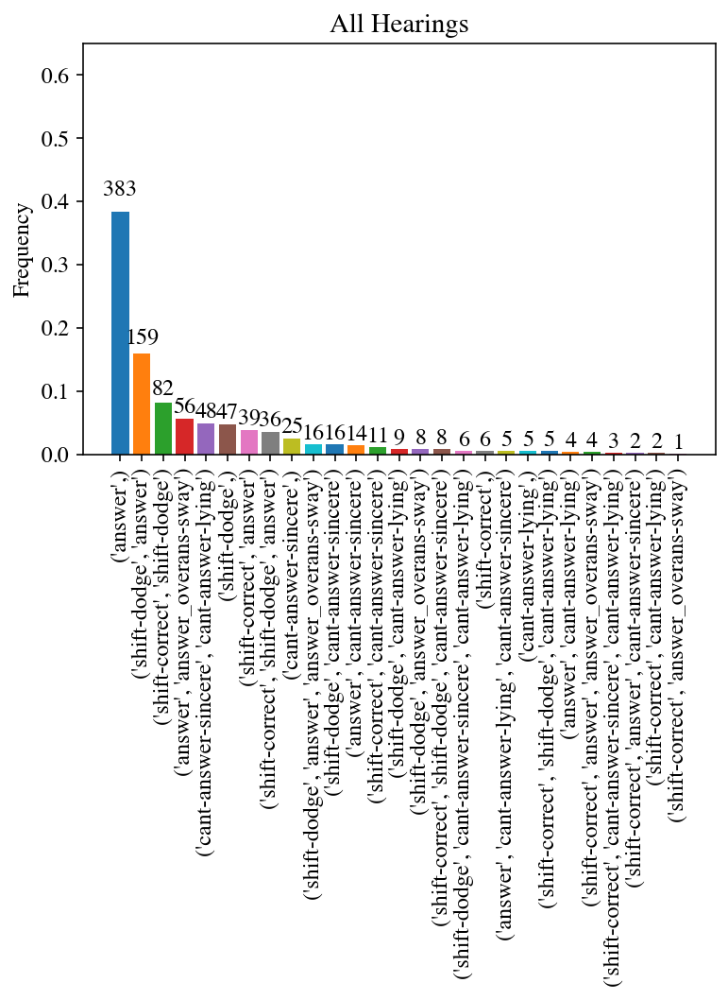

In [10]:
plot_freqs_counts_df_overall(gold_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

In [11]:
counts_dict = collections.Counter(list(chain.from_iterable(gold_df['gold_label_set'].values)))


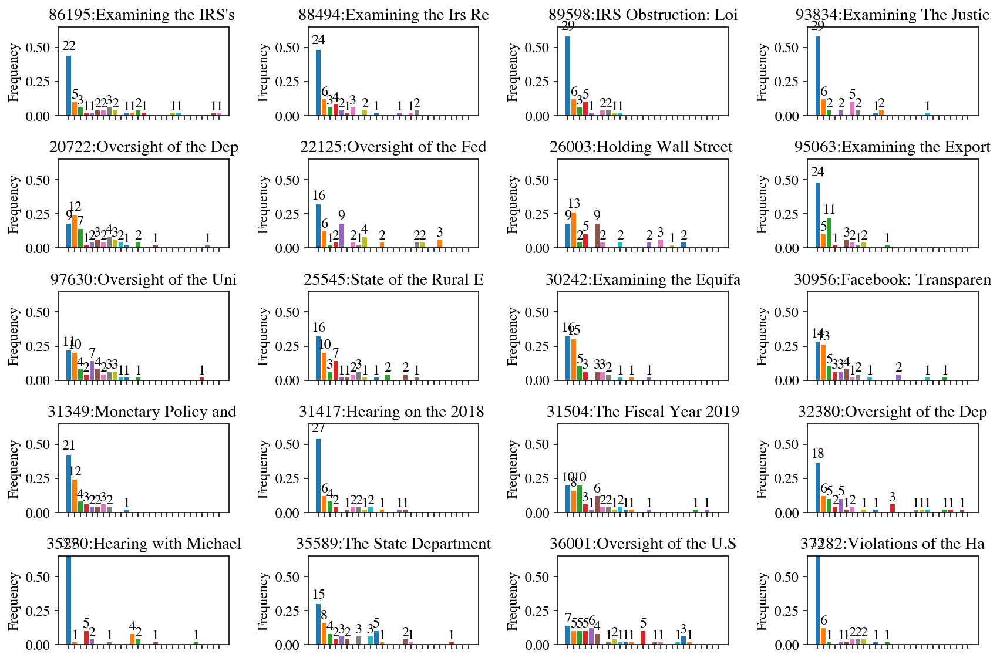

In [12]:
plot_freqs_counts_df(gold_df, 'gold_label_set', label_set_order, label_set_colors)

## Conversational acts

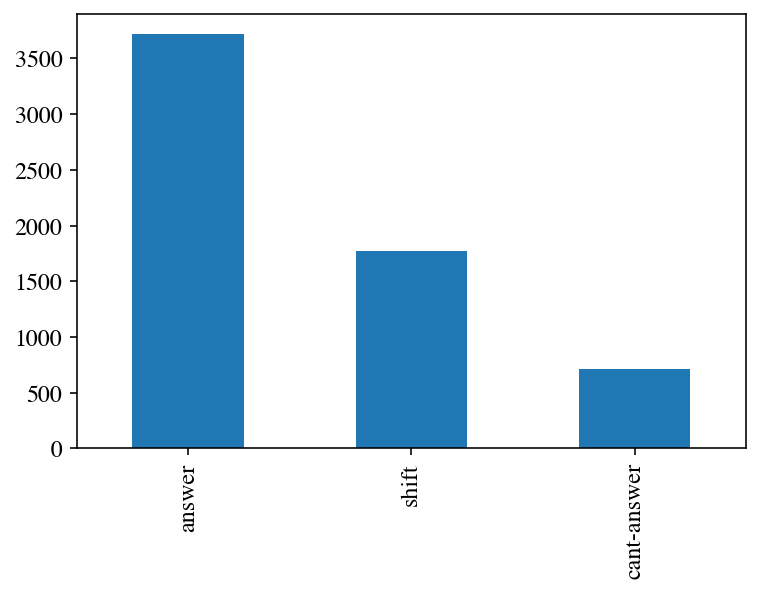

In [15]:
expanded_df['gold_act'].value_counts().plot(kind='bar')

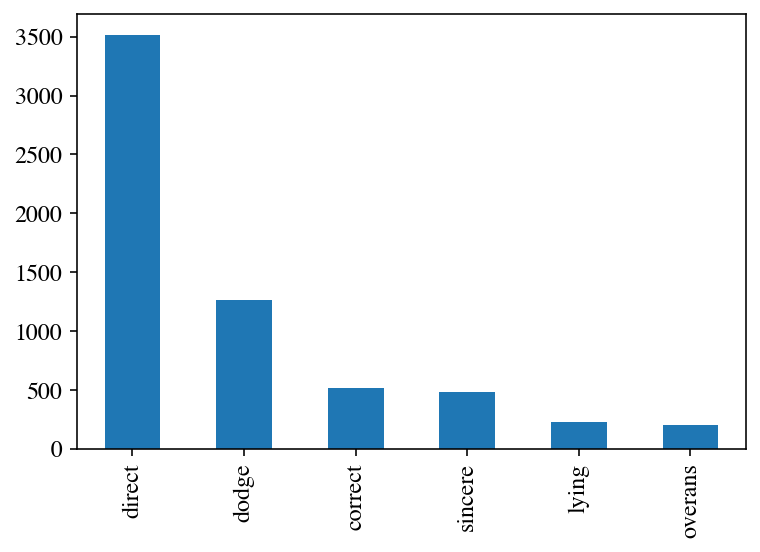

In [16]:
expanded_df['gold_intent'].value_counts().plot(kind='bar')

## Q1: Is there disagreement?

In [67]:
unambiguous_df = gold_df[gold_df['gold_label_set'].str.len()==1]
disagree_df = gold_df[gold_df['gold_label_set'].str.len()>1]
two_disagree_df = gold_df[gold_df['gold_label_set'].str.len()==2]
three_disagree_df = gold_df[gold_df['gold_label_set'].str.len()==3]

label_set_disagree_order = disagree_df['gold_label_set'].value_counts(sort=True).index

Response Label Disagreements
[0.466, 0.449, 0.085]


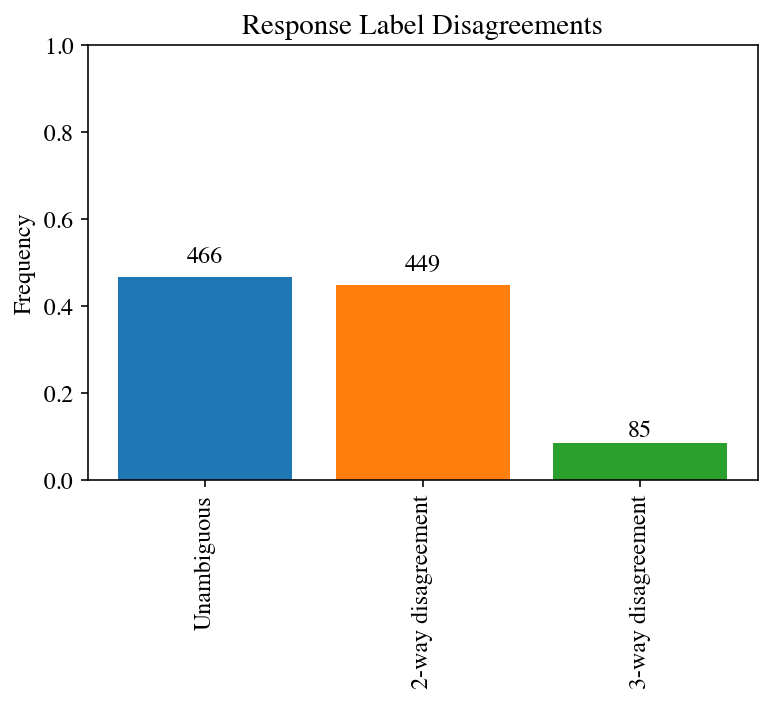

In [18]:
modes_dict = {'Unambiguous': len(unambiguous_df), '2-way disagreement': len(two_disagree_df),
              '3-way disagreement': len(three_disagree_df)}
plot_freqs_counts_dict(modes_dict, 'Response Label Disagreements', modes_dict.keys(), label_colors)

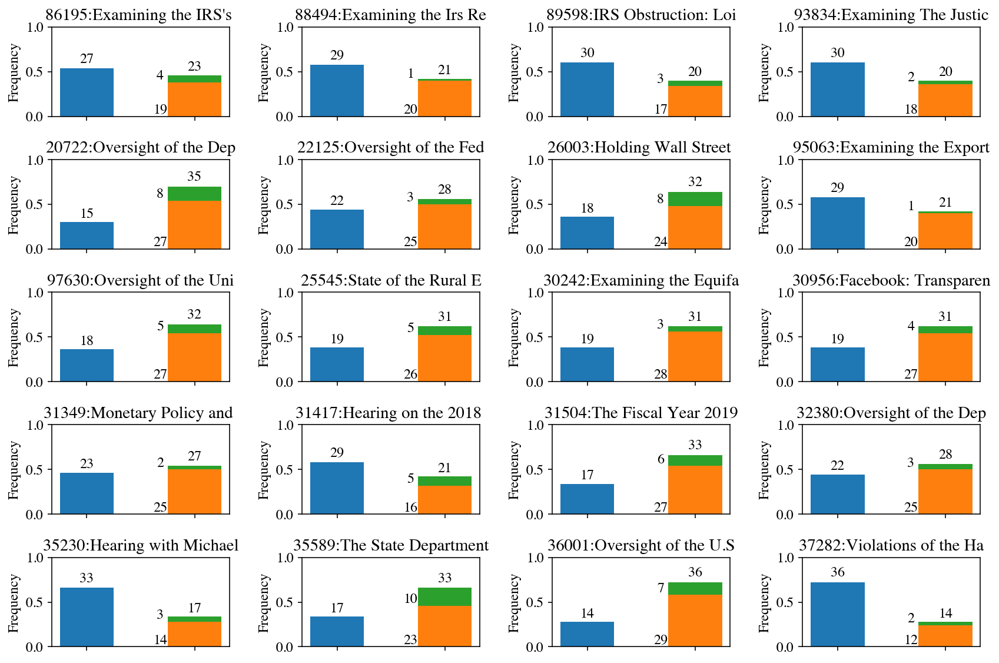

In [19]:
y_lim=1.0
hide_x_labels=False
column='gold_label_set'
n_hearings = len(gold_df['hearing_id'].unique())
n_cols=4
n_rows=math.ceil(n_hearings / n_cols)
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
grouped = gold_df.groupby(['hearing_id'])
row_idx, col_idx = 0, 0
for name, group in grouped:
    plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
    g_unambiguous_df = group[group[column].str.len()==1]
    g_two_disagree_df = group[group[column].str.len()==2]
    g_three_disagree_df = group[group[column].str.len()==3]
    g_modes_dict = {'Unambiguous': len(g_unambiguous_df), '2-way': len(g_two_disagree_df),
                   '3-way': len(g_three_disagree_df)}
    subplot_freqs_counts_stacked(g_modes_dict, axes[row_idx, col_idx], plot_title, g_modes_dict.keys(), label_colors, y_lim, hide_x_labels=True)
    # increment counters
    col_idx += 1
    if col_idx >= n_cols:
        col_idx = 0
        row_idx += 1
fig.tight_layout()
plt.show()
    

### Unambiguous: No disagreement

All Hearings
[0.8218884120171673, 0.0, 0.10085836909871244, 0.012875536480686695, 0.01072961373390558, 0.0536480686695279]


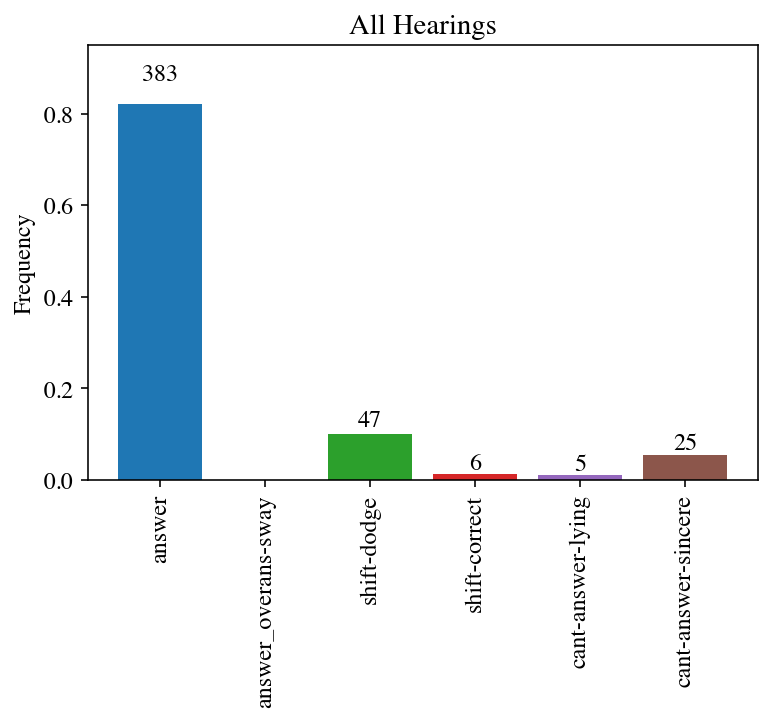

In [20]:
plot_freqs_counts_overall(unambiguous_df, 'gold_label_set', label_order, label_colors, y_lim=0.95, hide_x_labels=False)

86195:Examining the IRS's 
[0.8148148148148148, 0.0, 0.07407407407407407, 0.0, 0.037037037037037035, 0.07407407407407407]
88494:Examining the Irs Re
[0.8275862068965517, 0.0, 0.034482758620689655, 0.06896551724137931, 0.0, 0.06896551724137931]
89598:IRS Obstruction: Loi
[0.9666666666666667, 0.0, 0.0, 0.0, 0.0, 0.03333333333333333]
93834:Examining The Justic
[0.9666666666666667, 0.0, 0.0, 0.0, 0.03333333333333333, 0.0]
20722:Oversight of the Dep
[0.6, 0.0, 0.2, 0.0, 0.0, 0.2]
22125:Oversight of the Fed
[0.7272727272727273, 0.0, 0.0, 0.09090909090909091, 0.0, 0.18181818181818182]
26003:Holding Wall Street 
[0.5, 0.0, 0.5, 0.0, 0.0, 0.0]
95063:Examining the Export
[0.8275862068965517, 0.0, 0.10344827586206896, 0.0, 0.0, 0.06896551724137931]
97630:Oversight of the Uni
[0.6111111111111112, 0.0, 0.2222222222222222, 0.0, 0.0, 0.16666666666666666]
25545:State of the Rural E
[0.8421052631578947, 0.0, 0.05263157894736842, 0.05263157894736842, 0.0, 0.05263157894736842]
30242:Examining the Equifa


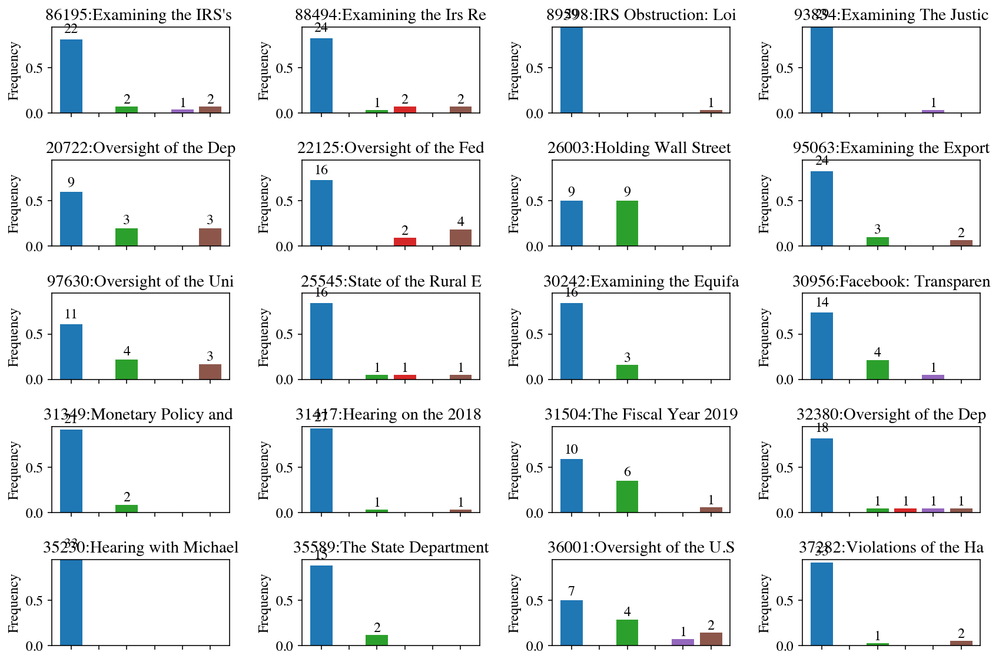

In [21]:
plot_freqs_counts(unambiguous_df, 'gold_label_set', label_order, label_colors, y_lim=0.95)

### Any disagreement (>1)

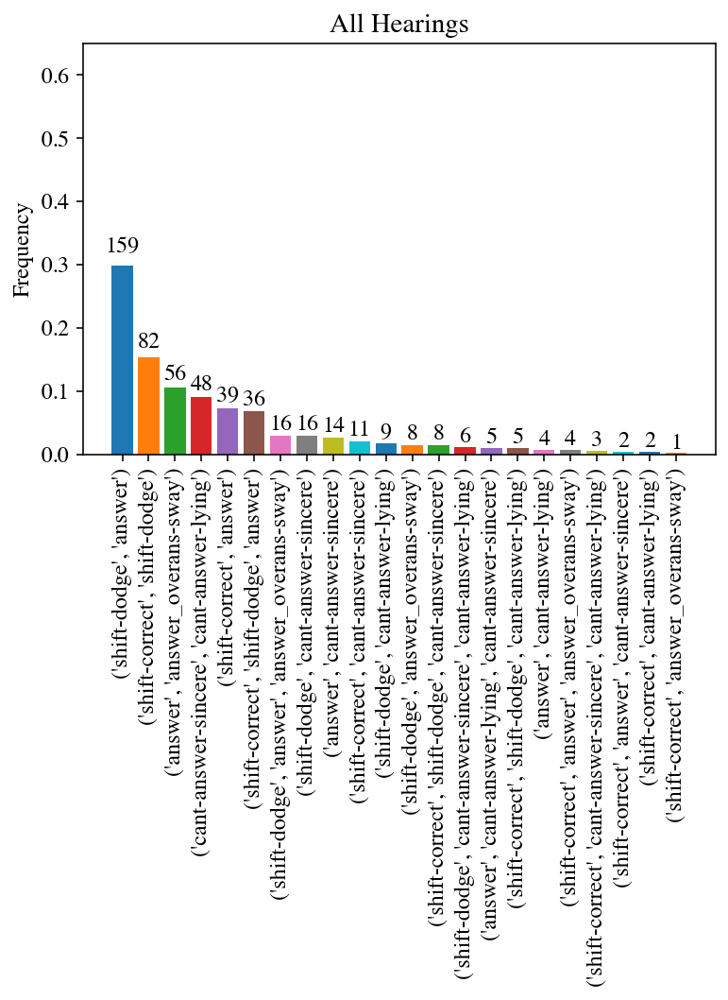

In [22]:
plot_freqs_counts_df_overall(disagree_df, 'gold_label_set', label_set_disagree_order, label_set_colors, hide_x_labels=False)

All Hearings
[0.29054640069384213, 0.07372072853425846, 0.2992194275802255, 0.1673894189071986, 0.07111882046834345, 0.09800520381613183]


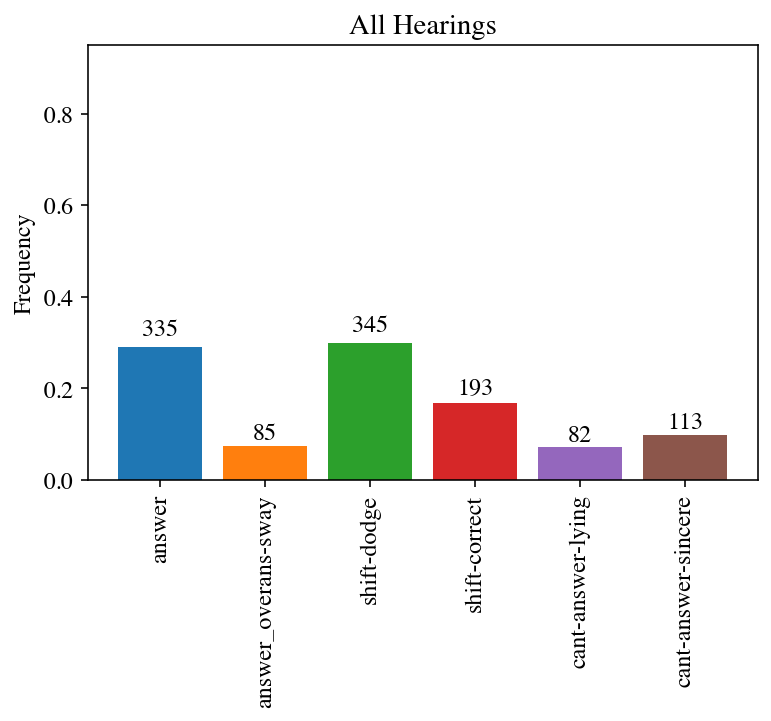

In [23]:
plot_freqs_counts_overall(disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95, hide_x_labels=False)

86195:Examining the IRS's 
[0.26, 0.04, 0.26, 0.24, 0.08, 0.12]
88494:Examining the Irs Re
[0.3023255813953488, 0.11627906976744186, 0.27906976744186046, 0.13953488372093023, 0.06976744186046512, 0.09302325581395349]
89598:IRS Obstruction: Loi
[0.37209302325581395, 0.13953488372093023, 0.27906976744186046, 0.16279069767441862, 0.023255813953488372, 0.023255813953488372]
93834:Examining The Justic
[0.35714285714285715, 0.0, 0.2619047619047619, 0.21428571428571427, 0.047619047619047616, 0.11904761904761904]
20722:Oversight of the Dep
[0.28205128205128205, 0.038461538461538464, 0.34615384615384615, 0.21794871794871795, 0.02564102564102564, 0.08974358974358974]
22125:Oversight of the Fed
[0.3050847457627119, 0.03389830508474576, 0.13559322033898305, 0.06779661016949153, 0.23728813559322035, 0.22033898305084745]
26003:Holding Wall Street 
[0.3194444444444444, 0.125, 0.3333333333333333, 0.08333333333333333, 0.08333333333333333, 0.05555555555555555]
95063:Examining the Export
[0.2093023255813

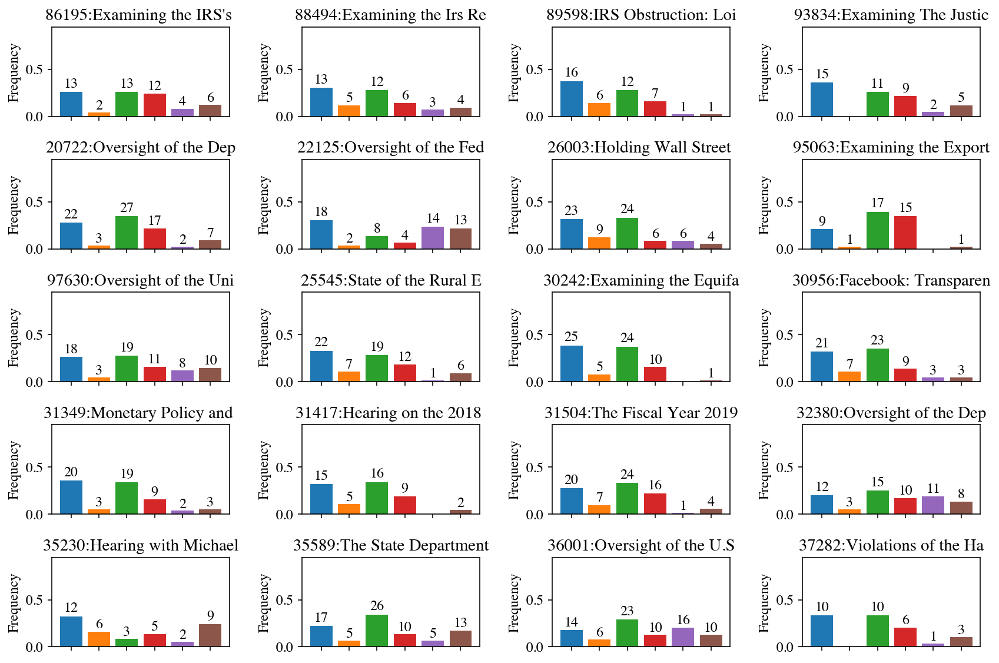

In [24]:
plot_freqs_counts(disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95)

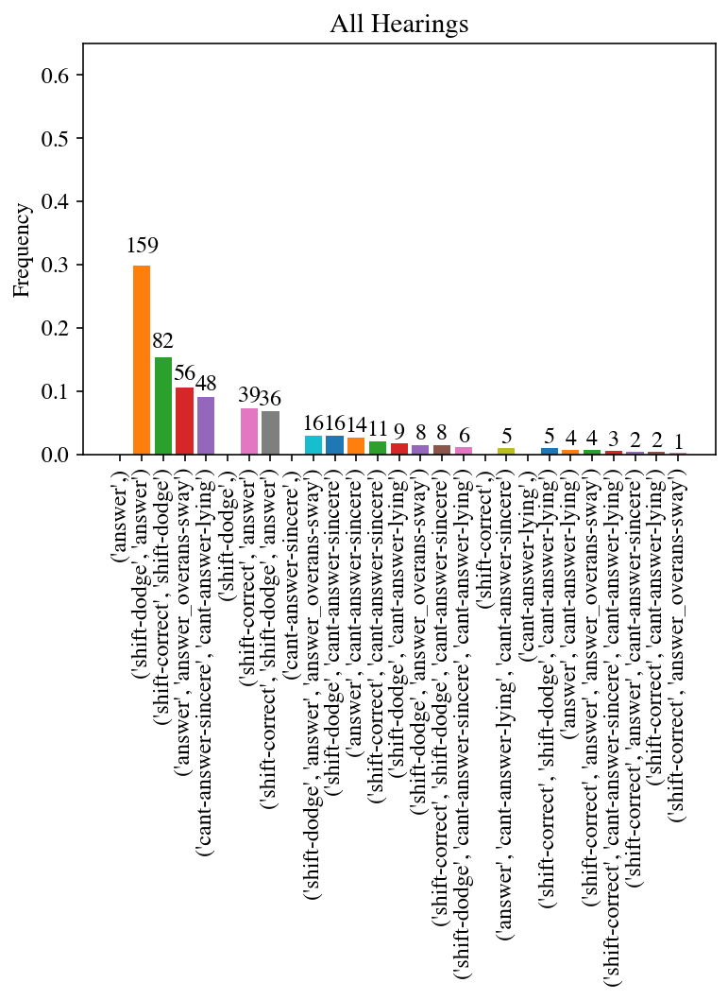

In [25]:
plot_freqs_counts_df_overall(disagree_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

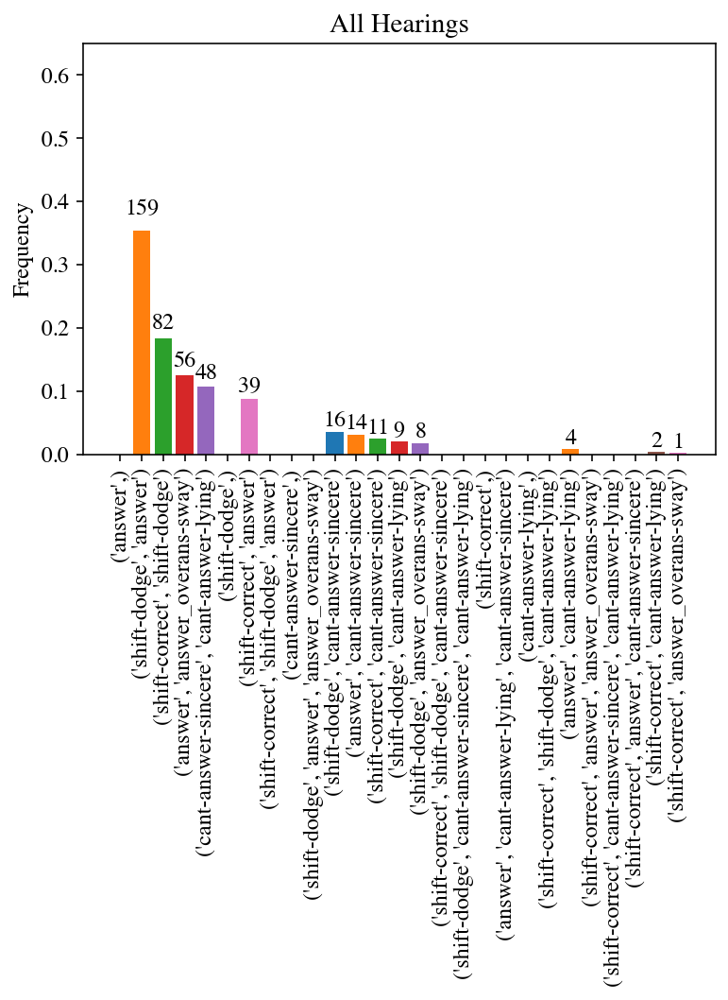

In [26]:
plot_freqs_counts_df_overall(two_disagree_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

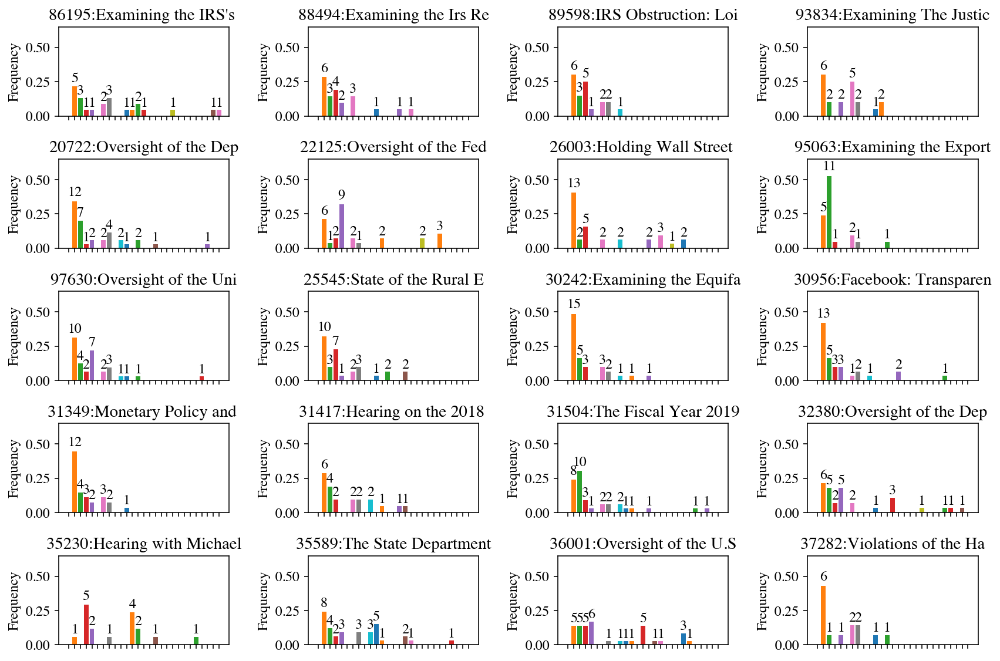

In [27]:
plot_freqs_counts_df(disagree_df, 'gold_label_set', label_set_order, label_set_colors)

### Two way: Some disagreement

All Hearings
[0.3028953229398664, 0.07238307349665925, 0.3051224944320713, 0.15033407572383073, 0.07015590200445435, 0.09910913140311804]


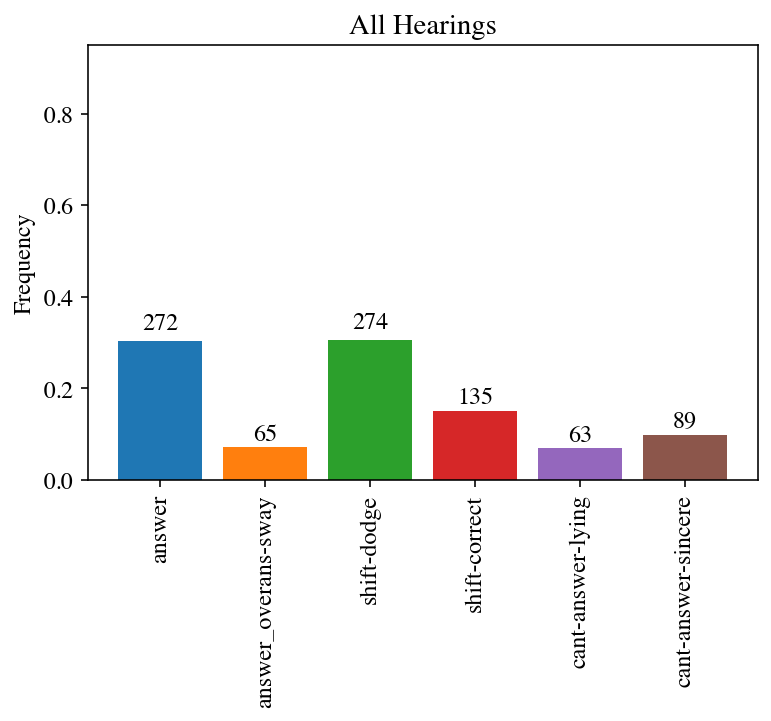

In [28]:
plot_freqs_counts_overall(two_disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95, hide_x_labels=False)

86195:Examining the IRS's 
[0.23684210526315788, 0.05263157894736842, 0.2631578947368421, 0.23684210526315788, 0.07894736842105263, 0.13157894736842105]
88494:Examining the Irs Re
[0.325, 0.125, 0.275, 0.15, 0.05, 0.075]
89598:IRS Obstruction: Loi
[0.38235294117647056, 0.14705882352941177, 0.2647058823529412, 0.14705882352941177, 0.029411764705882353, 0.029411764705882353]
93834:Examining The Justic
[0.3611111111111111, 0.0, 0.25, 0.19444444444444445, 0.05555555555555555, 0.1388888888888889]
20722:Oversight of the Dep
[0.2777777777777778, 0.018518518518518517, 0.37037037037037035, 0.2037037037037037, 0.037037037037037035, 0.09259259259259259]
22125:Oversight of the Fed
[0.3, 0.04, 0.14, 0.06, 0.24, 0.22]
26003:Holding Wall Street 
[0.4166666666666667, 0.14583333333333334, 0.3541666666666667, 0.08333333333333333, 0.0, 0.0]
95063:Examining the Export
[0.2, 0.025, 0.4, 0.35, 0.0, 0.025]
97630:Oversight of the Uni
[0.25925925925925924, 0.037037037037037035, 0.2777777777777778, 0.1296296296

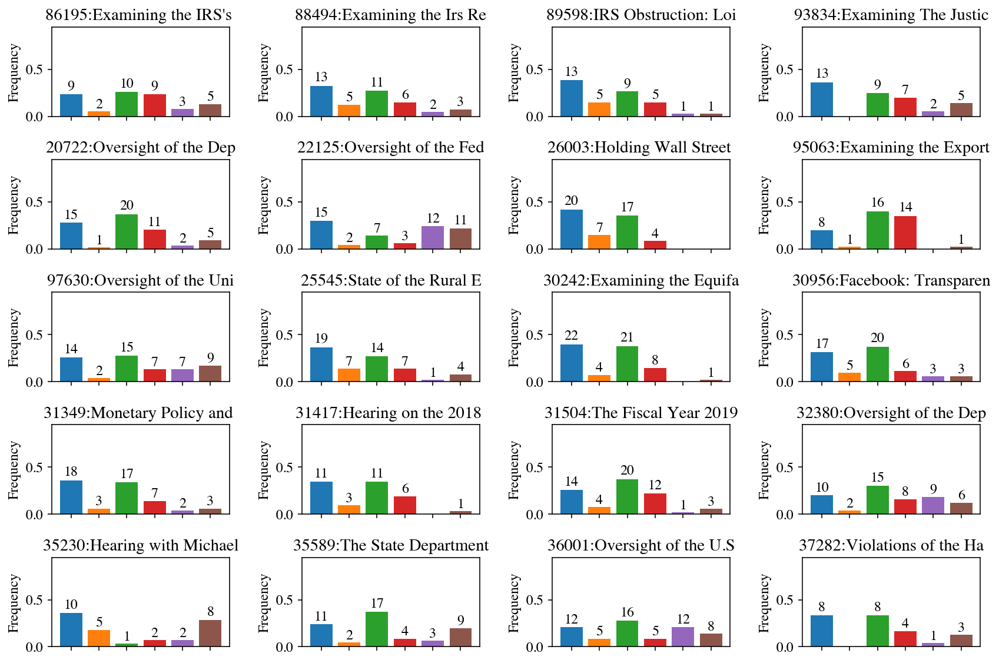

In [29]:
plot_freqs_counts(two_disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95)

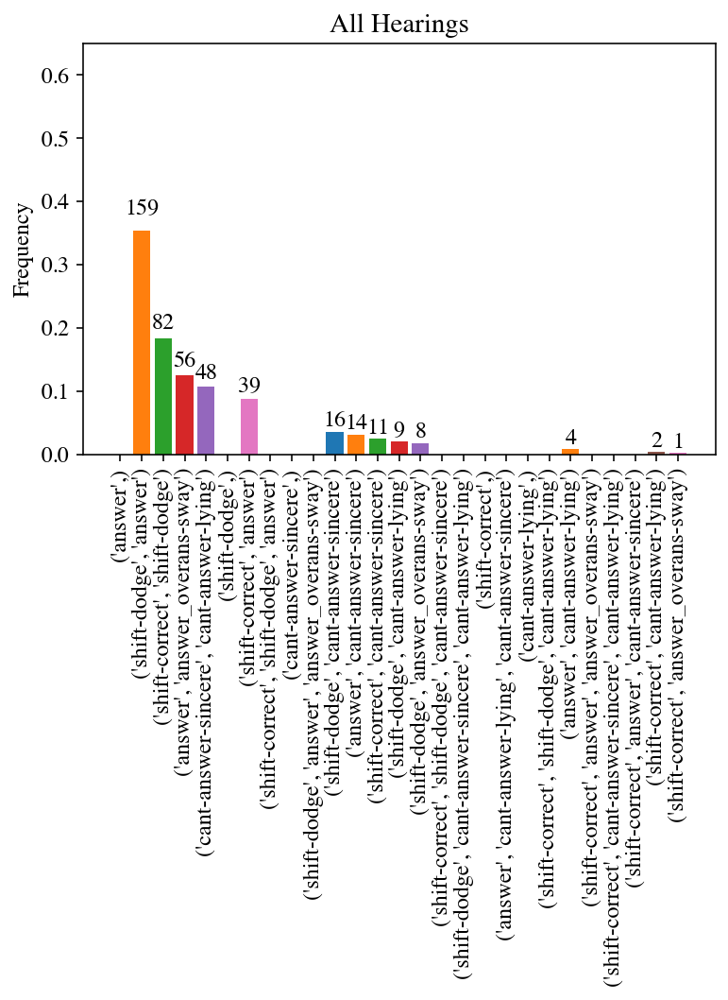

In [30]:
plot_freqs_counts_df_overall(two_disagree_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

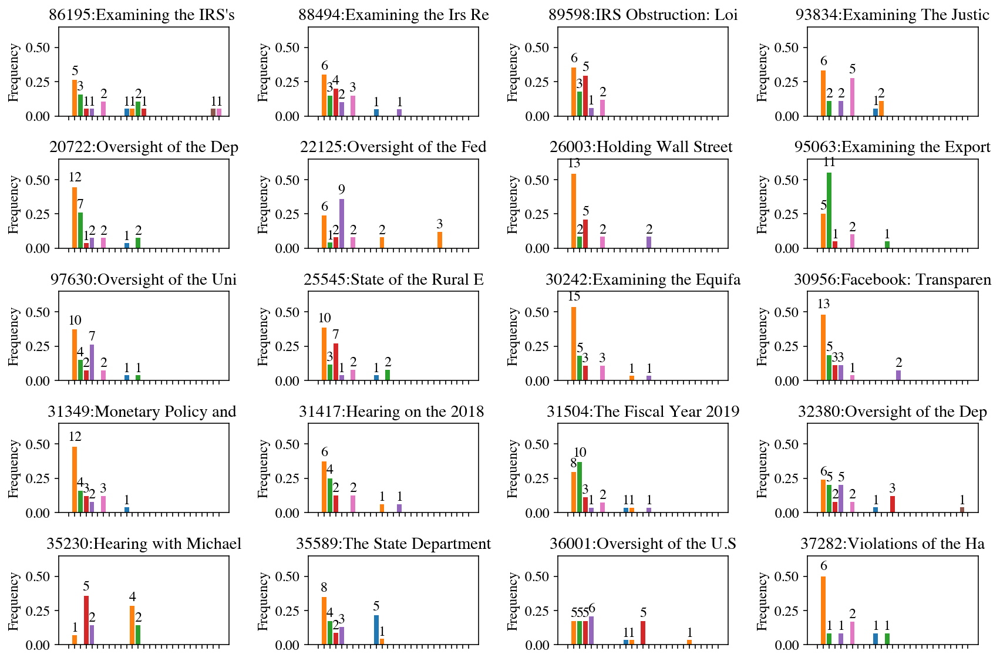

In [31]:
plot_freqs_counts_df(two_disagree_df, 'gold_label_set', label_set_order, label_set_colors)

### Three way: Lots of disagreement

All Hearings
[0.24705882352941178, 0.0784313725490196, 0.2784313725490196, 0.22745098039215686, 0.07450980392156863, 0.09411764705882353]


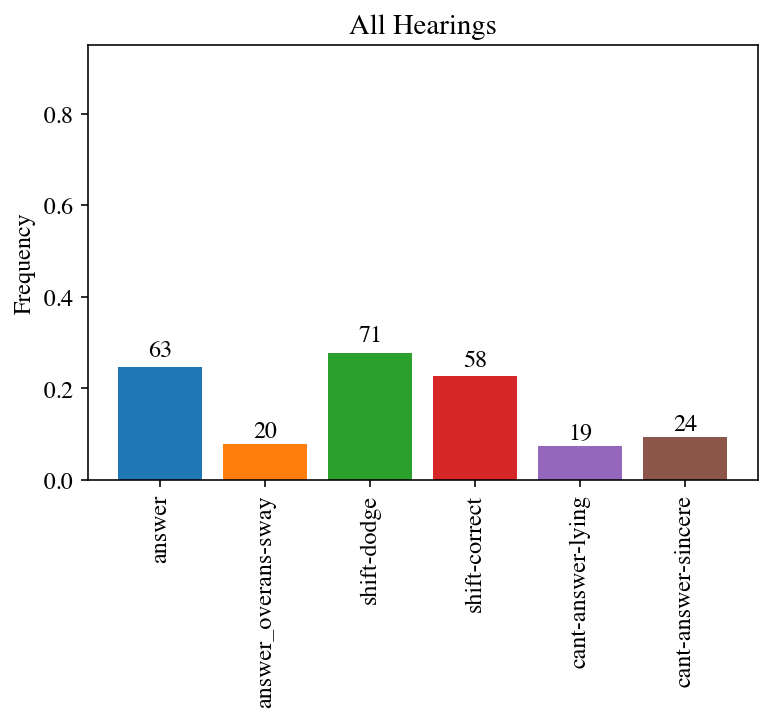

In [32]:
plot_freqs_counts_overall(three_disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95, hide_x_labels=False)

86195:Examining the IRS's 
[0.3333333333333333, 0.0, 0.25, 0.25, 0.08333333333333333, 0.08333333333333333]
88494:Examining the Irs Re
[0.0, 0.0, 0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333]
89598:IRS Obstruction: Loi
[0.3333333333333333, 0.1111111111111111, 0.3333333333333333, 0.2222222222222222, 0.0, 0.0]
93834:Examining The Justic
[0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0]
20722:Oversight of the Dep
[0.2916666666666667, 0.08333333333333333, 0.2916666666666667, 0.25, 0.0, 0.08333333333333333]
22125:Oversight of the Fed
[0.3333333333333333, 0.0, 0.1111111111111111, 0.1111111111111111, 0.2222222222222222, 0.2222222222222222]
26003:Holding Wall Street 
[0.125, 0.08333333333333333, 0.2916666666666667, 0.08333333333333333, 0.25, 0.16666666666666666]
95063:Examining the Export
[0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0]
97630:Oversight of the Uni
[0.26666666666666666, 0.06666666666666667, 0.2666666666666666

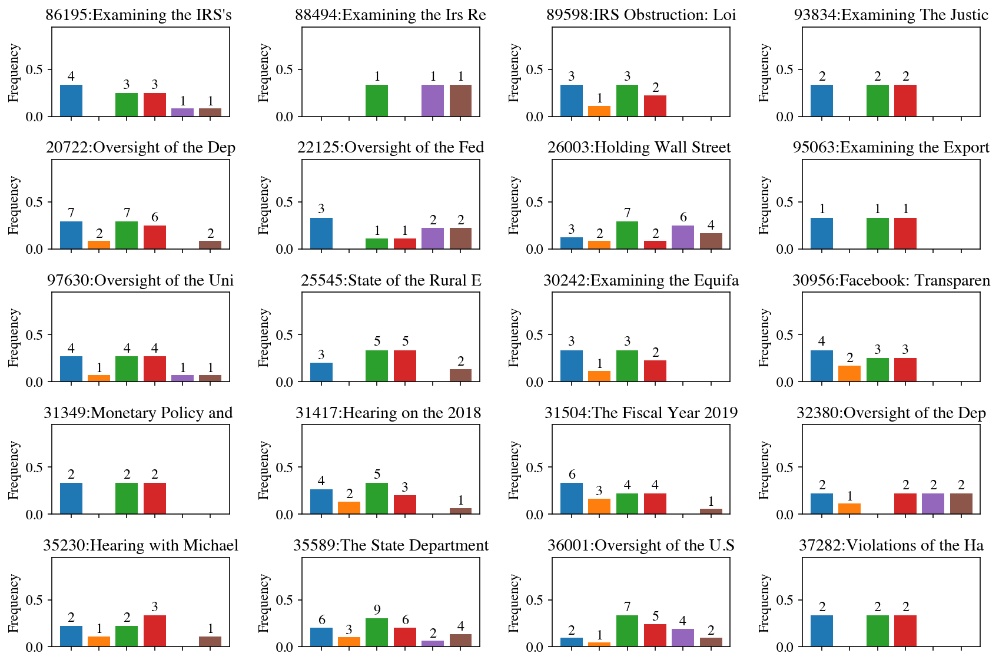

In [33]:
plot_freqs_counts(three_disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95)

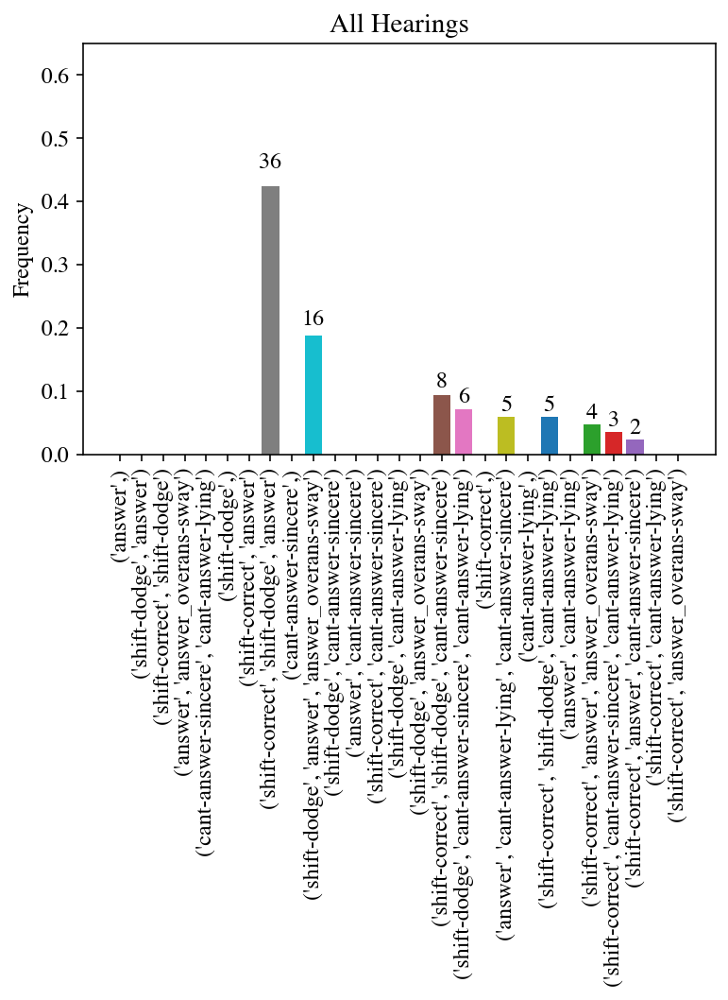

In [34]:
plot_freqs_counts_df_overall(three_disagree_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

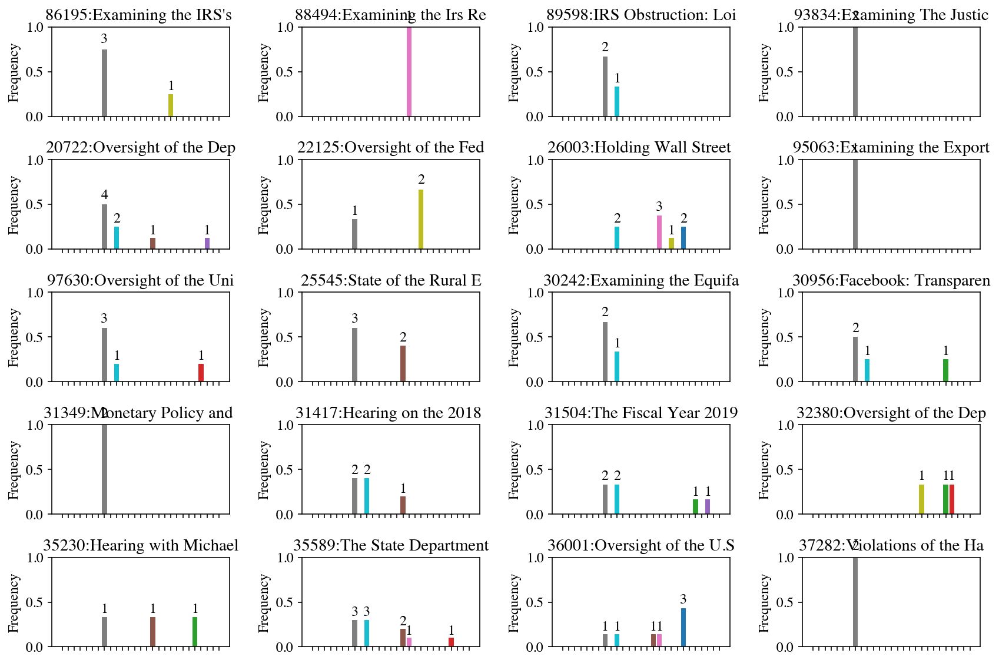

In [35]:
plot_freqs_counts_df(three_disagree_df, 'gold_label_set', label_set_order, label_set_colors, y_lim=1)

### Disagreement over time

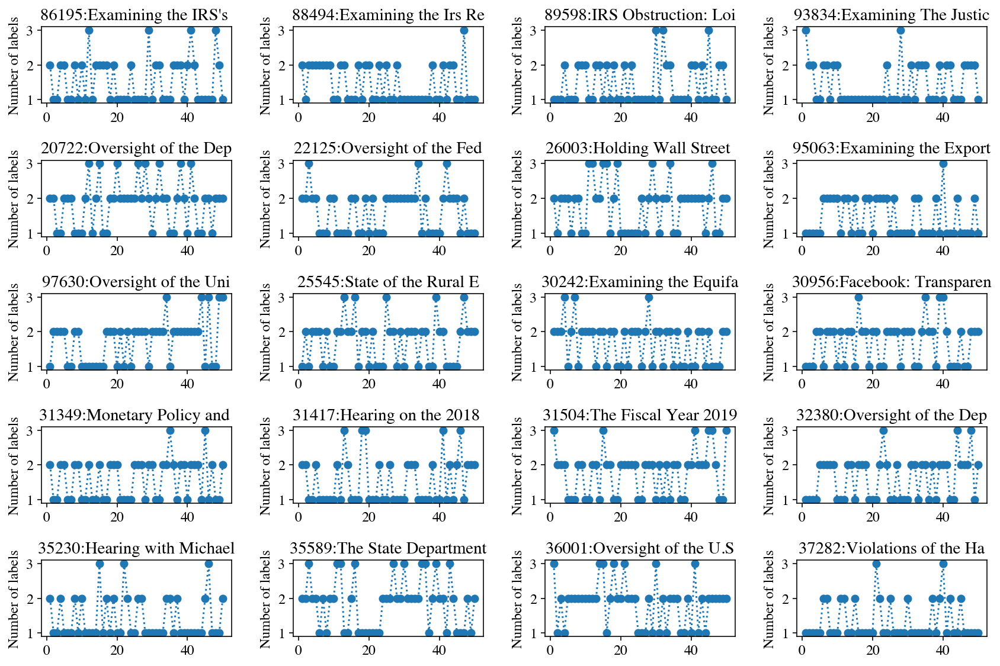

In [36]:
plot_disagreement_time(gold_df, 'gold_label_set')

In [37]:
from matplotlib.ticker import AutoMinorLocator
def subplot_scatter_sentiments(df, ax, plot_title):
    one_sided = []
    q_sentiments = df.groupby(['qa_index'])['gold_sentiment_num'].value_counts()
    y_labels = q_sentiments.index.levels[0]
    xs, ys, sizes, colors = [], [], [], []
    for y_idx, y_label in enumerate(y_labels):
        new_x = q_sentiments[y_label].index.values
        if np.all(new_x > 0) or np.all(new_x < 0) or np.all(new_x == 0):
            colors.extend(['r']*len(new_x))
            one_sided.append([new_x,q_sentiments[y_label].values])
        else:
            colors.extend(['b']*len(new_x))
        xs.extend(new_x)
        sizes.extend(q_sentiments[y_label].values*10)
        ys.extend([y_idx]*len(new_x))
    ax.set_title(plot_title)
    ax.scatter(xs,ys,s=sizes,alpha=0.3,color=colors)
    ax.yaxis.grid(True, linewidth=0.4, which='both',markevery=1)
    ax.yaxis.set_minor_locator(AutoMinorLocator(10))
    print(df['hearing_id'].unique())
    print('One sided', len(one_sided), one_sided)

['CHRG-113hhrg86195']
One sided 1 [[array([-1, -2]), array([2, 1])]]
['CHRG-113hhrg88494']
One sided 0 []
['CHRG-113hhrg89598']
One sided 0 []
['CHRG-113hhrg93834']
One sided 0 []
['CHRG-114hhrg20722']
One sided 0 []
['CHRG-114hhrg22125']
One sided 1 [[array([0]), array([3])]]
['CHRG-114hhrg26003']
One sided 0 []
['CHRG-114hhrg95063']
One sided 1 [[array([0]), array([4])]]
['CHRG-114hhrg97630']
One sided 1 [[array([-2, -1]), array([2, 2])]]
['CHRG-115hhrg25545']
One sided 0 []
['CHRG-115hhrg30242']
One sided 0 []
['CHRG-115hhrg30956']
One sided 0 []
['CHRG-115hhrg31349']
One sided 3 [[array([1, 2]), array([4, 1])], [array([1, 2]), array([5, 1])], [array([1, 2]), array([3, 1])]]
['CHRG-115hhrg31417']
One sided 0 []
['CHRG-115hhrg31504']
One sided 0 []
['CHRG-115hhrg32380']
One sided 0 []
['CHRG-116hhrg35230']
One sided 0 []
['CHRG-116hhrg35589']
One sided 0 []
['CHRG-116hhrg36001']
One sided 2 [[array([-3, -2, -1]), array([3, 2, 1])], [array([-3, -2, -1]), array([3, 2, 1])]]
['CHRG-116h

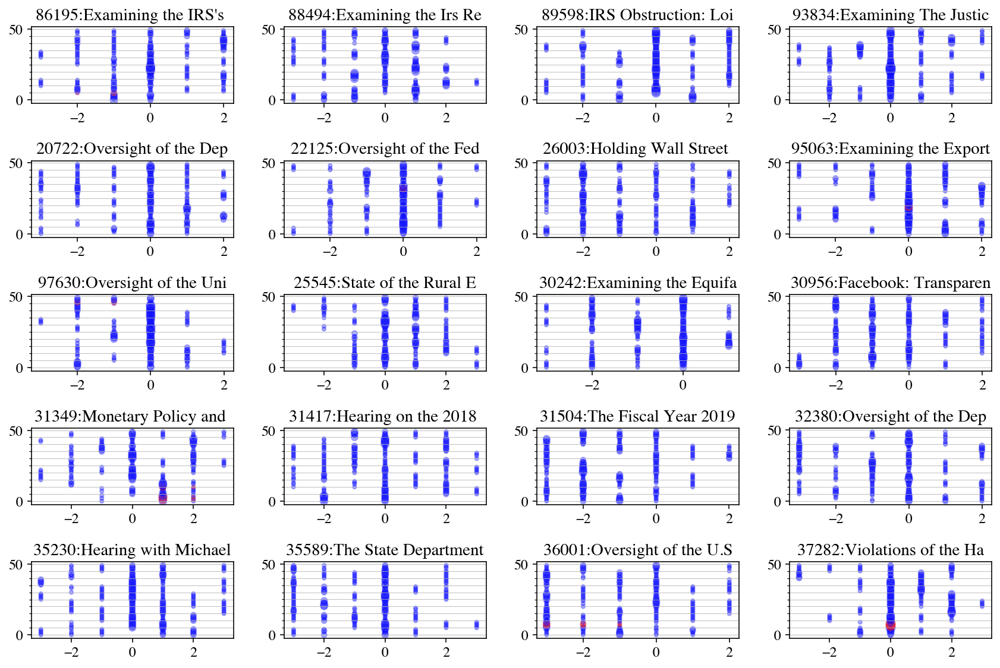

In [40]:
column='gold_sentiment'
n_hearings = len(expanded_df['hearing_id'].unique())
n_cols=4
n_rows=math.ceil(n_hearings / n_cols)
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
grouped_h = expanded_df.groupby(['hearing_id'])
row_idx, col_idx = 0, 0
for name, group_h in grouped_h:
    plot_title = name[-5:]+':'+group_h['hearing_title'].unique()[0][:20]
    subplot_scatter_sentiments(group_h, axes[row_idx, col_idx], plot_title)
    
    # increment counters
    col_idx += 1
    if col_idx >= n_cols:
        col_idx = 0
        row_idx += 1
fig.tight_layout()
plt.show()
    

All Hearings
[0.08330647760232034, 0.1453432162423461, 0.14727682887528198, 0.3602964872703835, 0.1455043506284241, 0.10457621656461488, 0.013696422816629068]


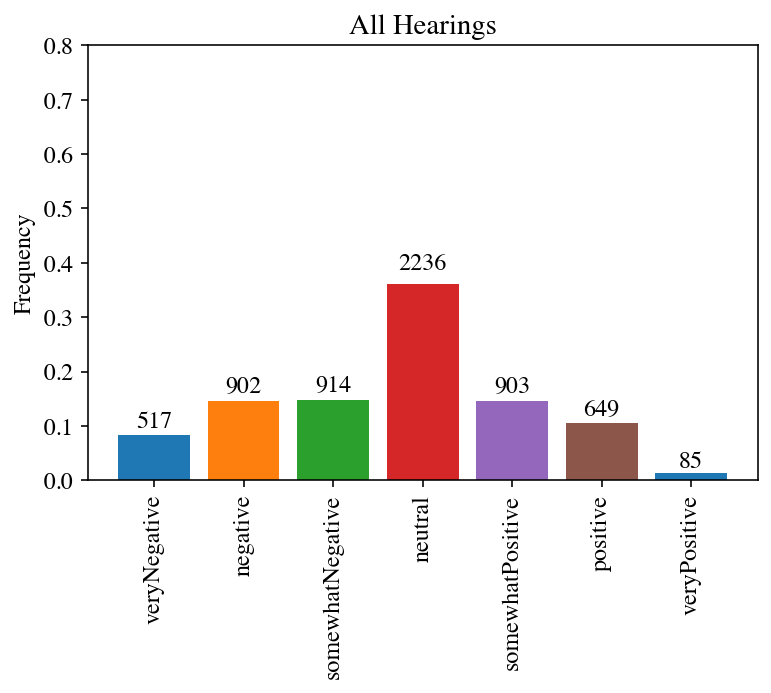

In [41]:
sent_order=['veryNegative','negative','somewhatNegative','neutral',
            'somewhatPositive', 'positive', 'veryPositive']
plot_freqs_counts_overall(gold_df, 'gold_sentiments', sent_order, label_colors, hide_x_labels=False)

86195:Examining the IRS's 
[0.03289473684210526, 0.12828947368421054, 0.20723684210526316, 0.35526315789473684, 0.10197368421052631, 0.17434210526315788, 0.0]
88494:Examining the Irs Re
[0.06583072100313479, 0.10344827586206896, 0.18808777429467086, 0.2664576802507837, 0.2727272727272727, 0.09090909090909091, 0.012539184952978056]
89598:IRS Obstruction: Loi
[0.04504504504504504, 0.12612612612612611, 0.1111111111111111, 0.42342342342342343, 0.12912912912912913, 0.16516516516516516, 0.0]
93834:Examining The Justic
[0.031055900621118012, 0.13043478260869565, 0.09937888198757763, 0.46273291925465837, 0.13043478260869565, 0.10248447204968944, 0.043478260869565216]
20722:Oversight of the Dep
[0.09491525423728814, 0.12203389830508475, 0.09830508474576272, 0.4033898305084746, 0.19661016949152543, 0.0847457627118644, 0.0]
22125:Oversight of the Fed
[0.027874564459930314, 0.12195121951219512, 0.17073170731707318, 0.5052264808362369, 0.14285714285714285, 0.0313588850174216, 0.0]
26003:Holding Wal

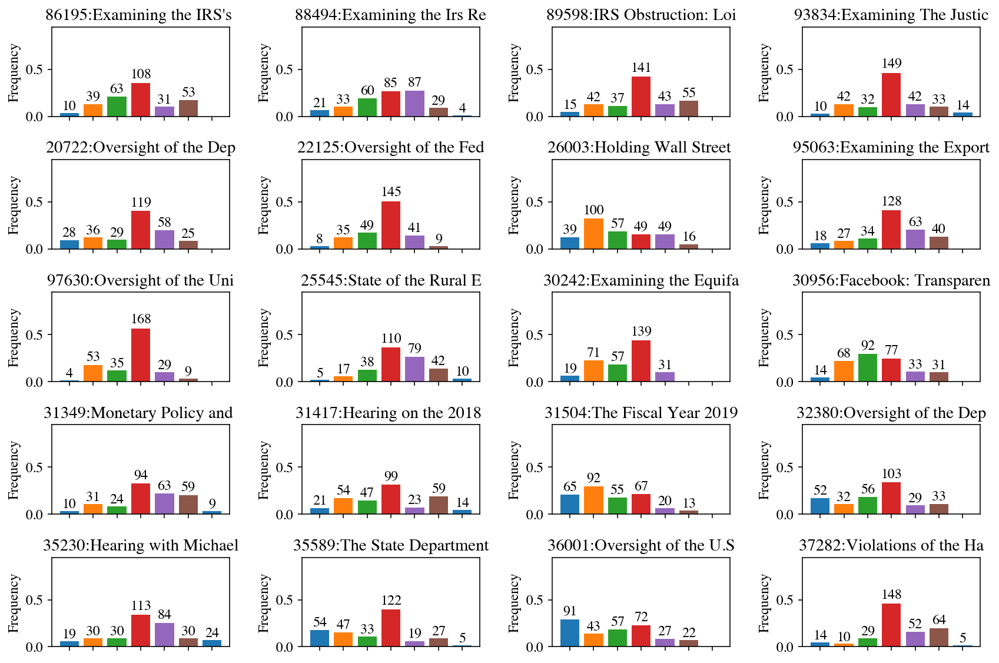

In [42]:
plot_freqs_counts(gold_df, 'gold_sentiments', sent_order, label_colors, y_lim=0.95)

## Q2: Is disagreement 'real'?

### 1. IAA

In [43]:
def calculate_iaa(df, intent_label, intent_code_dict):
    intent_agreement = pd.DataFrame(columns=df['qa_index'].unique(),index=list(set(chain.from_iterable(df['gold_workers'].values))))
    for item in intent_agreement.columns:
        labels, workers = df[df['qa_index']==item][[intent_label,'gold_workers']].values[0]
        for label, worker in zip(labels, workers):
            intent_agreement.loc[worker,item] = intent_code_dict[label]
    print(" #workers, #items:",intent_agreement.shape)
    intent_agreement = intent_agreement.fillna('*')
    intent_agreement_array = intent_agreement.to_numpy()
    missing = "*"
    return(k.krippendorff_alpha(intent_agreement_array, k.nominal_metric, missing_items=missing))
    
def calculate_iaa_sentiment(df, intent_label, intent_code_dict, sentiment_labels):
    missing = "*"
    for sentiment_label in sentiment_labels:
        mask = df['gold_sentiments'].apply(lambda x: sentiment_label in x)
        df_sentiment = df[mask]
        intent_agreement = pd.DataFrame(columns=df_sentiment['qa_index'].unique())
        for item in intent_agreement.columns:
            sentiments, workers, intents = df_sentiment[df_sentiment['qa_index']==item][['gold_sentiments','gold_workers',intent_label]].values[0]
            for sentiment, worker, intent in zip(sentiments, workers, intents):
                if sentiment==sentiment_label:
                    intent_agreement.loc[worker, item] = intent_code_dict[intent]
        intent_agreement.dropna(how='all', axis=0, inplace=True)
        intent_agreement = intent_agreement.fillna('*')
        intent_agreement_array = intent_agreement.to_numpy()
        print("Processing sentiment ", sentiment_label," #workers, #items:",intent_agreement.shape)
        try:
            print(k.krippendorff_alpha(intent_agreement_array, k.nominal_metric, missing_items=missing))
        except ValueError as e1:
            print("Caught ValueError exception: ", e1)
        except Exception as e2:
            print("Caught other exception: ", e2)
            
def calculate_iaa_sentiment_coarse(df, intent_label, intent_code_dict):
    missing = "*"
    sentiment_coarse_to_fine = {'negative':['veryNegative','negative','somewhatNegative'],
                                'neutral':['neutral'],
                                'positive':['somewhatPositive', 'positive', 'veryPositive']}
    for sentiment_group, sentiment_labels in sentiment_coarse_to_fine.items():
        mask = df['gold_sentiments'].apply(lambda x: any(item for item in sentiment_labels if item in x))
        df_sentiment = df[mask]
        intent_agreement = pd.DataFrame(columns=df_sentiment['qa_index'].unique())
        for item in intent_agreement.columns:
            sentiments, workers, intents = df_sentiment[df_sentiment['qa_index']==item][['gold_sentiments','gold_workers',intent_label]].values[0]
            for sentiment, worker, intent in zip(sentiments, workers, intents):
                if sentiment in sentiment_labels:
                    intent_agreement.loc[worker, item] = intent_code_dict[intent]
        intent_agreement.dropna(how='all', axis=0, inplace=True)
        intent_agreement = intent_agreement.fillna('*')
        intent_agreement_array = intent_agreement.to_numpy()
        print("Processing sentiment group", sentiment_group," #workers, #items:",intent_agreement.shape)
        try:
            print(k.krippendorff_alpha(intent_agreement_array, k.nominal_metric, missing_items=missing))
        except ValueError as e1:
            print("Caught ValueError exception: ", e1)
        except Exception as e2:
            print("Caught other exception: ", e2)

#### Overall

In [44]:
act_intent_to_code = {'answer':0, 'answer_overans-sway':1, 
                 'shift-dodge':2, 'shift-correct':3,
                 'cant-answer-lying':4, 'cant-answer-sincere':5}
k_all = calculate_iaa(gold_df, 'gold_coarse_labels', act_intent_to_code)
print(k_all)

 #workers, #items: (68, 1000)
0.4943113680883192


In [45]:
act_to_code = {'answer':0, 'shift':1, 'cant-answer':2}
k_act_all = calculate_iaa(gold_df, 'gold_acts', act_to_code)
print(k_act_all)

 #workers, #items: (68, 1000)
0.652237642446218


In [46]:
intent_to_code = {'direct':0, 'overans':1, 'dodge':2, 'correct':3, 
                  'lying':4, 'sincere':5}
k_intent_all = calculate_iaa(gold_df, 'gold_intents', intent_to_code)
print(k_intent_all)

 #workers, #items: (68, 1000)
0.4943113680883192


In [61]:
intent_binary_to_code = {0:0, 1:1}
k_intent_binary_all = calculate_iaa(gold_df, 'gold_intents_binary', intent_binary_to_code)
print(k_intent_binary_all)

 #workers, #items: (68, 1000)
0.3768473872429029


In [62]:
k_unambiguous = calculate_iaa(unambiguous_df, 'gold_coarse_labels', act_intent_to_code)
print(k_unambiguous)

 #workers, #items: (66, 466)
1.0


In [63]:
k_disagree = calculate_iaa(disagree_df, 'gold_coarse_labels', act_intent_to_code)
print(k_disagree)

 #workers, #items: (63, 534)
0.23274109232101559


In [64]:
k_act_disagree = calculate_iaa(disagree_df, 'gold_acts', act_to_code)
print(k_act_all)

 #workers, #items: (63, 534)
0.652237642446218


In [65]:
k_intent_disagree = calculate_iaa(disagree_df, 'gold_intents', intent_to_code)
print(k_intent_disagree)

 #workers, #items: (63, 534)
0.23274109232101559


In [68]:
k_intent_binary_disagree = calculate_iaa(disagree_df, 'gold_intents_binary', intent_binary_to_code)
print(k_intent_binary_disagree)

 #workers, #items: (63, 534)
0.058017590835919286


In [69]:
k_two_disagree = calculate_iaa(two_disagree_df, 'gold_coarse_labels', act_intent_to_code)
print(k_two_disagree)

 #workers, #items: (60, 449)
0.2759328680740456


In [70]:
k_three_disagree = calculate_iaa(three_disagree_df, 'gold_coarse_labels', act_intent_to_code)
print(k_three_disagree)

 #workers, #items: (47, 85)
0.021572020021010108


#### By sentiment: fine-grained

In [71]:
sentiment_labels = ['veryNegative', 'negative', 'somewhatNegative',
                     'neutral',
                     'somewhatPositive', 'positive', 'veryPositive']

In [72]:
calculate_iaa_sentiment(gold_df, 'gold_coarse_labels', act_intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (20, 404)
0.4142371551836841
Processing sentiment  negative  #workers, #items: (34, 614)
0.5382960380823869
Processing sentiment  somewhatNegative  #workers, #items: (36, 593)
0.49414101720467984
Processing sentiment  neutral  #workers, #items: (35, 945)
0.5058523009337543
Processing sentiment  somewhatPositive  #workers, #items: (38, 601)
0.4860357355809557
Processing sentiment  positive  #workers, #items: (21, 461)
0.5101156069364163
Processing sentiment  veryPositive  #workers, #items: (4, 85)
Caught ValueError exception:  No items to compare.


In [73]:
calculate_iaa_sentiment(disagree_df, 'gold_coarse_labels', act_intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 266)
0.22646443514644343
Processing sentiment  negative  #workers, #items: (34, 373)
0.2990799275041842
Processing sentiment  somewhatNegative  #workers, #items: (35, 334)
0.2243195785776999
Processing sentiment  neutral  #workers, #items: (31, 503)
0.2747008402428721
Processing sentiment  somewhatPositive  #workers, #items: (36, 299)
0.2556227309088671
Processing sentiment  positive  #workers, #items: (20, 220)
0.22818791946308725
Processing sentiment  veryPositive  #workers, #items: (4, 33)
Caught ValueError exception:  No items to compare.


In [74]:
calculate_iaa_sentiment(two_disagree_df, 'gold_coarse_labels', act_intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 210)
0.2674990541051835
Processing sentiment  negative  #workers, #items: (33, 310)
0.3534314985495538
Processing sentiment  somewhatNegative  #workers, #items: (35, 272)
0.27223299240145293
Processing sentiment  neutral  #workers, #items: (29, 420)
0.32986708032484957
Processing sentiment  somewhatPositive  #workers, #items: (36, 252)
0.2858176555716353
Processing sentiment  positive  #workers, #items: (20, 180)
0.30101735487731895
Processing sentiment  veryPositive  #workers, #items: (4, 28)
Caught ValueError exception:  No items to compare.


In [75]:
calculate_iaa_sentiment(three_disagree_df, 'gold_coarse_labels', act_intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (18, 56)
0.06919060052219328
Processing sentiment  negative  #workers, #items: (22, 63)
0.021746880570409965
Processing sentiment  somewhatNegative  #workers, #items: (25, 62)
-0.02124999999999999
Processing sentiment  neutral  #workers, #items: (22, 83)
0.004881869760352431
Processing sentiment  somewhatPositive  #workers, #items: (20, 47)
-0.00983606557377037
Processing sentiment  positive  #workers, #items: (12, 40)
-0.16666666666666652
Processing sentiment  veryPositive  #workers, #items: (3, 5)
Caught ValueError exception:  No items to compare.


In [76]:
calculate_iaa_sentiment(gold_df, 'gold_acts', act_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (20, 404)
0.5399135446685879
Processing sentiment  negative  #workers, #items: (34, 614)
0.6960523412044188
Processing sentiment  somewhatNegative  #workers, #items: (36, 593)
0.6849361250385546
Processing sentiment  neutral  #workers, #items: (35, 945)
0.6540463849723774
Processing sentiment  somewhatPositive  #workers, #items: (38, 601)
0.6504899809858125
Processing sentiment  positive  #workers, #items: (21, 461)
0.6649961177384062
Processing sentiment  veryPositive  #workers, #items: (4, 85)
Caught ValueError exception:  No items to compare.


In [77]:
calculate_iaa_sentiment(disagree_df, 'gold_acts', act_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 266)
0.38306451612903214
Processing sentiment  negative  #workers, #items: (34, 373)
0.5041151599264113
Processing sentiment  somewhatNegative  #workers, #items: (35, 334)
0.47854785478547857
Processing sentiment  neutral  #workers, #items: (31, 503)
0.4572514235585977
Processing sentiment  somewhatPositive  #workers, #items: (36, 299)
0.45962390432186795
Processing sentiment  positive  #workers, #items: (20, 220)
0.42883046237533995
Processing sentiment  veryPositive  #workers, #items: (4, 33)
Caught ValueError exception:  No items to compare.


In [78]:
calculate_iaa_sentiment(two_disagree_df, 'gold_acts', act_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 210)
0.41839080459770117
Processing sentiment  negative  #workers, #items: (33, 310)
0.5856668601968054
Processing sentiment  somewhatNegative  #workers, #items: (35, 272)
0.5136719820264124
Processing sentiment  neutral  #workers, #items: (29, 420)
0.5396386610404742
Processing sentiment  somewhatPositive  #workers, #items: (36, 252)
0.5062611806797854
Processing sentiment  positive  #workers, #items: (20, 180)
0.4859154929577465
Processing sentiment  veryPositive  #workers, #items: (4, 28)
Caught ValueError exception:  No items to compare.


In [79]:
calculate_iaa_sentiment(three_disagree_df, 'gold_acts', act_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (18, 56)
0.25075528700906347
Processing sentiment  negative  #workers, #items: (22, 63)
0.06130268199233724
Processing sentiment  somewhatNegative  #workers, #items: (25, 62)
0.26752336448598124
Processing sentiment  neutral  #workers, #items: (22, 83)
0.04945970978697134
Processing sentiment  somewhatPositive  #workers, #items: (20, 47)
0.10400000000000009
Processing sentiment  positive  #workers, #items: (12, 40)
0.08571428571428563
Processing sentiment  veryPositive  #workers, #items: (3, 5)
Caught ValueError exception:  No items to compare.


In [80]:
calculate_iaa_sentiment(gold_df, 'gold_intents', intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (20, 404)
0.4142371551836841
Processing sentiment  negative  #workers, #items: (34, 614)
0.5382960380823869
Processing sentiment  somewhatNegative  #workers, #items: (36, 593)
0.49414101720467984
Processing sentiment  neutral  #workers, #items: (35, 945)
0.5058523009337543
Processing sentiment  somewhatPositive  #workers, #items: (38, 601)
0.4860357355809557
Processing sentiment  positive  #workers, #items: (21, 461)
0.5101156069364163
Processing sentiment  veryPositive  #workers, #items: (4, 85)
Caught ValueError exception:  No items to compare.


In [81]:
calculate_iaa_sentiment(disagree_df, 'gold_intents', intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 266)
0.22646443514644343
Processing sentiment  negative  #workers, #items: (34, 373)
0.2990799275041842
Processing sentiment  somewhatNegative  #workers, #items: (35, 334)
0.2243195785776999
Processing sentiment  neutral  #workers, #items: (31, 503)
0.2747008402428721
Processing sentiment  somewhatPositive  #workers, #items: (36, 299)
0.2556227309088671
Processing sentiment  positive  #workers, #items: (20, 220)
0.22818791946308725
Processing sentiment  veryPositive  #workers, #items: (4, 33)
Caught ValueError exception:  No items to compare.


In [82]:
calculate_iaa_sentiment(two_disagree_df, 'gold_intents', intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 210)
0.2674990541051835
Processing sentiment  negative  #workers, #items: (33, 310)
0.3534314985495538
Processing sentiment  somewhatNegative  #workers, #items: (35, 272)
0.27223299240145293
Processing sentiment  neutral  #workers, #items: (29, 420)
0.32986708032484957
Processing sentiment  somewhatPositive  #workers, #items: (36, 252)
0.2858176555716353
Processing sentiment  positive  #workers, #items: (20, 180)
0.30101735487731895
Processing sentiment  veryPositive  #workers, #items: (4, 28)
Caught ValueError exception:  No items to compare.


In [83]:
calculate_iaa_sentiment(three_disagree_df, 'gold_intents', intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (18, 56)
0.06919060052219328
Processing sentiment  negative  #workers, #items: (22, 63)
0.021746880570409965
Processing sentiment  somewhatNegative  #workers, #items: (25, 62)
-0.02124999999999999
Processing sentiment  neutral  #workers, #items: (22, 83)
0.004881869760352431
Processing sentiment  somewhatPositive  #workers, #items: (20, 47)
-0.00983606557377037
Processing sentiment  positive  #workers, #items: (12, 40)
-0.16666666666666652
Processing sentiment  veryPositive  #workers, #items: (3, 5)
Caught ValueError exception:  No items to compare.


#### By sentiment: coarse-grained

In [84]:
calculate_iaa_sentiment_coarse(gold_df, 'gold_coarse_labels', act_intent_to_code)

Processing sentiment group negative  #workers, #items: (47, 898)
0.5169640971615748
Processing sentiment group neutral  #workers, #items: (35, 945)
0.5058523009337543
Processing sentiment group positive  #workers, #items: (41, 796)
0.5027405954454871


In [85]:
calculate_iaa_sentiment_coarse(disagree_df, 'gold_coarse_labels', act_intent_to_code)

Processing sentiment group negative  #workers, #items: (45, 506)
0.26538213004721367
Processing sentiment group neutral  #workers, #items: (31, 503)
0.2747008402428721
Processing sentiment group positive  #workers, #items: (40, 411)
0.2501396094799184


In [86]:
calculate_iaa_sentiment_coarse(two_disagree_df, 'gold_coarse_labels', act_intent_to_code)

Processing sentiment group negative  #workers, #items: (44, 423)
0.30874323979322926
Processing sentiment group neutral  #workers, #items: (29, 420)
0.32986708032484957
Processing sentiment group positive  #workers, #items: (40, 343)
0.2981087438244696


In [87]:
calculate_iaa_sentiment_coarse(three_disagree_df, 'gold_coarse_labels', act_intent_to_code)

Processing sentiment group negative  #workers, #items: (36, 83)
0.07734034806128953
Processing sentiment group neutral  #workers, #items: (22, 83)
0.004881869760352431
Processing sentiment group positive  #workers, #items: (22, 68)
-0.06026879462410761


In [88]:
calculate_iaa_sentiment_coarse(gold_df, 'gold_acts', act_to_code)

Processing sentiment group negative  #workers, #items: (47, 898)
0.6702228831635015
Processing sentiment group neutral  #workers, #items: (35, 945)
0.6540463849723774
Processing sentiment group positive  #workers, #items: (41, 796)
0.6611446604117579


In [89]:
calculate_iaa_sentiment_coarse(disagree_df, 'gold_acts', act_to_code)

Processing sentiment group negative  #workers, #items: (45, 506)
0.47126725328615526
Processing sentiment group neutral  #workers, #items: (31, 503)
0.4572514235585977
Processing sentiment group positive  #workers, #items: (40, 411)
0.45523600229313976


In [90]:
calculate_iaa_sentiment_coarse(two_disagree_df, 'gold_acts', act_to_code)

Processing sentiment group negative  #workers, #items: (44, 423)
0.5341239605096063
Processing sentiment group neutral  #workers, #items: (29, 420)
0.5396386610404742
Processing sentiment group positive  #workers, #items: (40, 343)
0.500575009583493


In [91]:
calculate_iaa_sentiment_coarse(three_disagree_df, 'gold_acts', act_to_code)

Processing sentiment group negative  #workers, #items: (36, 83)
0.19218793438976922
Processing sentiment group neutral  #workers, #items: (22, 83)
0.04945970978697134
Processing sentiment group positive  #workers, #items: (22, 68)
0.1756829137653989


In [92]:
calculate_iaa_sentiment_coarse(gold_df, 'gold_intents', intent_to_code)

Processing sentiment group negative  #workers, #items: (47, 898)
0.5169640971615748
Processing sentiment group neutral  #workers, #items: (35, 945)
0.5058523009337543
Processing sentiment group positive  #workers, #items: (41, 796)
0.5027405954454871


In [93]:
calculate_iaa_sentiment_coarse(disagree_df, 'gold_intents', intent_to_code)

Processing sentiment group negative  #workers, #items: (45, 506)
0.26538213004721367
Processing sentiment group neutral  #workers, #items: (31, 503)
0.2747008402428721
Processing sentiment group positive  #workers, #items: (40, 411)
0.2501396094799184


In [94]:
calculate_iaa_sentiment_coarse(two_disagree_df, 'gold_intents', intent_to_code)

Processing sentiment group negative  #workers, #items: (44, 423)
0.30874323979322926
Processing sentiment group neutral  #workers, #items: (29, 420)
0.32986708032484957
Processing sentiment group positive  #workers, #items: (40, 343)
0.2981087438244696


In [95]:
calculate_iaa_sentiment_coarse(three_disagree_df, 'gold_intents', intent_to_code)

Processing sentiment group negative  #workers, #items: (36, 83)
0.07734034806128953
Processing sentiment group neutral  #workers, #items: (22, 83)
0.004881869760352431
Processing sentiment group positive  #workers, #items: (22, 68)
-0.06026879462410761


In [96]:
calculate_iaa_sentiment_coarse(gold_df, 'gold_intents_binary', intent_binary_to_code)

Processing sentiment group negative  #workers, #items: (47, 898)
0.4626987076338024
Processing sentiment group neutral  #workers, #items: (35, 945)
0.22043564470007948
Processing sentiment group positive  #workers, #items: (41, 796)
0.26295013397817135


In [97]:
calculate_iaa_sentiment_coarse(disagree_df, 'gold_intents_binary', intent_binary_to_code)

Processing sentiment group negative  #workers, #items: (45, 506)
0.060287016322810194
Processing sentiment group neutral  #workers, #items: (31, 503)
-0.02820481018119092
Processing sentiment group positive  #workers, #items: (40, 411)
0.0008367291496875762


In [98]:
calculate_iaa_sentiment_coarse(two_disagree_df, 'gold_intents_binary', intent_binary_to_code)

Processing sentiment group negative  #workers, #items: (44, 423)
0.08327896079245456
Processing sentiment group neutral  #workers, #items: (29, 420)
-0.019199701427874194
Processing sentiment group positive  #workers, #items: (40, 343)
0.02999463231347299


In [99]:
calculate_iaa_sentiment_coarse(three_disagree_df, 'gold_intents_binary', intent_binary_to_code)

Processing sentiment group negative  #workers, #items: (36, 83)
-0.041183455873064156
Processing sentiment group neutral  #workers, #items: (22, 83)
-0.0803376803376803
Processing sentiment group positive  #workers, #items: (22, 68)
-0.17187499999999978


#### Reference IAA for perfect disagreement

In [100]:
num_items = 533 #533, 448(446), 85 (84)
num_annotators=62
num_annotators_per_hit = 6
modes_to_items = {2: (446,[(158,[0,2]), 
                            (82,[2,3]),
                            (56,[0,1]),
                            (50,[4,5]), 
                            (40,[0,3]),
                            (16,[2,5]),
                            (14,[0,5]),
                            (12,[3,5]),
                            (10,[2,5]),
                            (8, [1,2])]),
                 3: (87, [(36, [0,2,3]),
                          (18, [0,1,3]),
                          (9,  [2,3,5]),
                          (6,  [2,4,5]),
                          (6,  [2,3,4]),
                          (6,  [0,4,5]),
                          (3,  [0,1,5]),
                          (3,  [3,4,5])])}
def create_data_frame(num_items, num_annotators, 
                      num_annotators_per_hit, modes_to_items):
    num_annos = num_items * num_annotators_per_hit
    annotator_pattern = list(range(num_annotators))*num_annotators_per_hit
    num_repeats = math.ceil(num_annos/len(annotator_pattern))
    annotators = (num_repeats * annotator_pattern)[:num_annos]
    items = []
    labels = []
    item_id = 0
    for num_modes, (num_items_in_mode, class_proportions) in modes_to_items.items():
        print("Processing mode", num_modes)
        #for item in item_ids[items_added:items_added+num_items_in_mode]: #30
        #print("Processing item id", item)
        print(num_modes)
        print(class_proportions)
        votes_per_class = num_annotators_per_hit//num_modes #6
        for (num_items_in_class, classes) in class_proportions:
            item_votes = []
            for _class in classes:
                item_votes.extend([_class]*votes_per_class)
            print("Votes for item: ", item_votes, ", num items: ", num_items_in_class)
            labels.extend(item_votes*num_items_in_class)
            items.extend(np.repeat((range(item_id,num_items_in_class+item_id)),num_annotators_per_hit))
            item_id += num_items_in_class
        #items_added += num_items_in_mode
    print(len(labels), labels)    
    print(len(items), items)
    print(len(annotators), annotators)

    # sanity check
    expected_length = num_items * num_annotators_per_hit
    assert(len(items) == expected_length)
    assert(len(annotators) == expected_length)
    assert(len(labels) == expected_length)

    # create dataframe
    data = zip(items, annotators, labels)
    df = pd.DataFrame(list(data), columns = ['qa_index', 'worker_id', 'intent'])
    return df

In [101]:
fake_df = create_data_frame(num_items, num_annotators, num_annotators_per_hit, modes_to_items)

Processing mode 2
2
[(158, [0, 2]), (82, [2, 3]), (56, [0, 1]), (50, [4, 5]), (40, [0, 3]), (16, [2, 5]), (14, [0, 5]), (12, [3, 5]), (10, [2, 5]), (8, [1, 2])]
Votes for item:  [0, 0, 0, 2, 2, 2] , num items:  158
Votes for item:  [2, 2, 2, 3, 3, 3] , num items:  82
Votes for item:  [0, 0, 0, 1, 1, 1] , num items:  56
Votes for item:  [4, 4, 4, 5, 5, 5] , num items:  50
Votes for item:  [0, 0, 0, 3, 3, 3] , num items:  40
Votes for item:  [2, 2, 2, 5, 5, 5] , num items:  16
Votes for item:  [0, 0, 0, 5, 5, 5] , num items:  14
Votes for item:  [3, 3, 3, 5, 5, 5] , num items:  12
Votes for item:  [2, 2, 2, 5, 5, 5] , num items:  10
Votes for item:  [1, 1, 1, 2, 2, 2] , num items:  8
Processing mode 3
3
[(36, [0, 2, 3]), (18, [0, 1, 3]), (9, [2, 3, 5]), (6, [2, 4, 5]), (6, [2, 3, 4]), (6, [0, 4, 5]), (3, [0, 1, 5]), (3, [3, 4, 5])]
Votes for item:  [0, 0, 2, 2, 3, 3] , num items:  36
Votes for item:  [0, 0, 1, 1, 3, 3] , num items:  18
Votes for item:  [2, 2, 3, 3, 5, 5] , num items:  9


In [102]:
def calculate_iaa_simple(df, coded_label):
    grouped = df.sort_values(by=['worker_id']).groupby(['worker_id'])
    anno_to_items = {}
    for name, group in grouped:
        anno_to_items[name] = group['qa_index'].unique()
    intent_agreement = pd.DataFrame(columns=df['qa_index'].unique(), index=df['worker_id'].unique())
    annotators = df['worker_id'].unique()
    for annotator in annotators:
        for item in anno_to_items[annotator]:
            intent_agreement.loc[annotator,item] = df.loc[(df['worker_id']==annotator) & (df['qa_index']==item), [coded_label]].to_numpy()[0][0]
    intent_agreement = intent_agreement.fillna("*")
    intent_agreement_array = intent_agreement.to_numpy()
    missing = "*"
    return(k.krippendorff_alpha(intent_agreement_array, k.nominal_metric, missing_items=missing))

In [103]:
k_fake = calculate_iaa_simple(fake_df, 'intent')
print(k_fake)

0.18811669121834274


# Q3: Is intent correlated with other factors?

In [123]:
def get_correlations(df, nominal_columns):
    print("Cramer's V")
    fig, ax = plt.subplots(figsize=(14, 10))
    print(nominal.associations(df, theil_u=False, plot=True, return_results=True, ax=ax, nominal_columns=nominal_columns))
    fig.tight_layout()
    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom + 0.5, top - 0.5)
    plt.show()
    print("Theil's U")
    fig, ax = plt.subplots(figsize=(14, 10))
    print(nominal.associations(df, theil_u=True, plot=True, return_results=True, ax=ax, nominal_columns=nominal_columns))
    fig.tight_layout()
    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom + 0.5, top - 0.5)
    plt.show()

In [124]:
expanded_df['hit_order'] = pd.to_numeric(expanded_df['hit_order'], downcast='integer')
gold_df['hit_order'] = pd.to_numeric(gold_df['hit_order'], downcast='integer')

Cramer's V
                             gold_fine_label  gold_coarse_label  \
gold_fine_label                     1.000000           0.999193   
gold_coarse_label                   0.999193           1.000000   
gold_q_intent                       0.086031           0.065388   
gold_sentiment_num                  0.375952           0.354263   
gold_sentiment_coarse_num           0.359105           0.337807   
gold_q_sentiment_num                0.130085           0.114135   
gold_q_sentiment_coarse_num         0.121577           0.107215   
hearing_id                          0.134865           0.190509   
q_speaker                           0.212798           0.285072   
hit_order                           0.078661           0.037874   
gold_worker                         0.127596           0.162398   
gold_work_time                      0.113210           0.065962   
q_text_len                          0.166241           0.095224   
r_text_len                          0.477096       

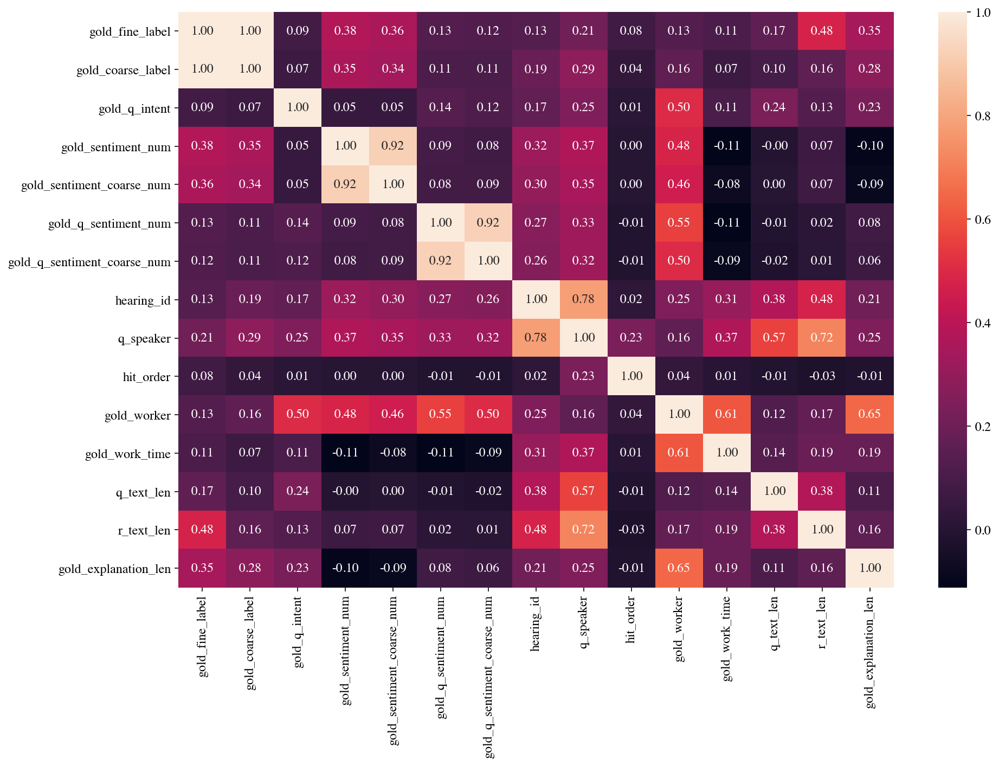

Theil's U


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


                             gold_fine_label  gold_coarse_label  \
gold_fine_label                     1.000000           0.625228   
gold_coarse_label                   1.000000           1.000000   
gold_q_intent                       0.012226           0.006746   
gold_sentiment_num                  0.375952           0.354263   
gold_sentiment_coarse_num           0.359105           0.337807   
gold_q_sentiment_num                0.130085           0.114135   
gold_q_sentiment_coarse_num         0.121577           0.107215   
hearing_id                          0.052409           0.032823   
q_speaker                           0.091723           0.056265   
hit_order                           0.078661           0.037874   
gold_worker                         0.059191           0.030252   
gold_work_time                      0.113210           0.065962   
q_text_len                          0.166241           0.095224   
r_text_len                          0.477096           0.16013

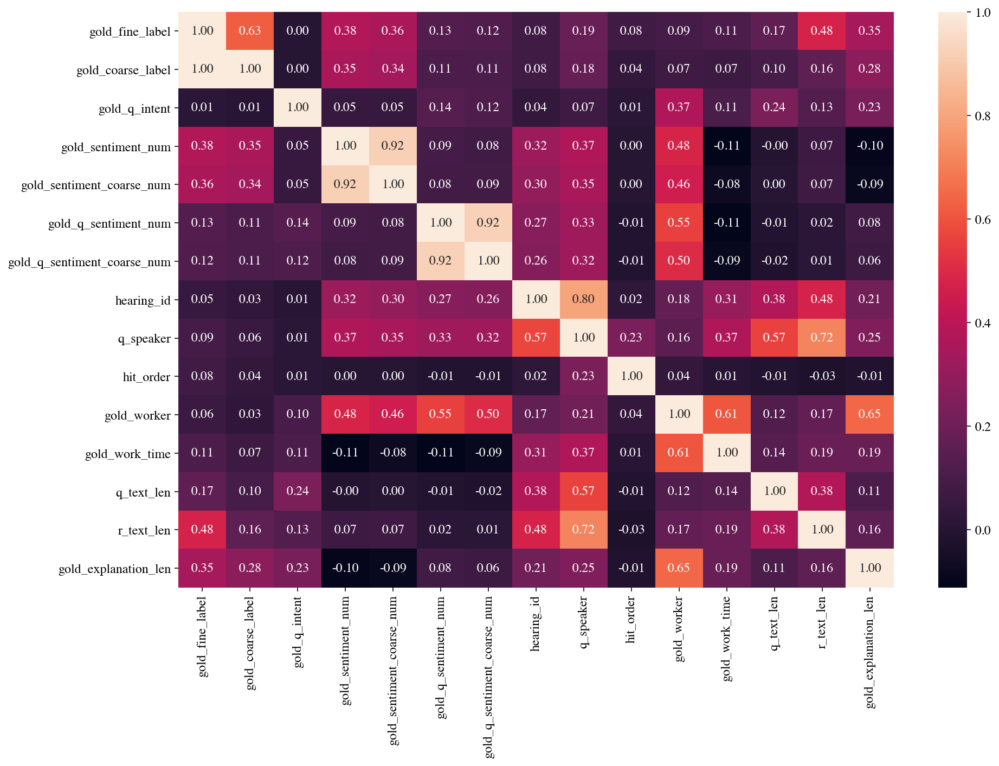

In [125]:
nominal_columns = ['gold_fine_label', 'gold_coarse_label','gold_q_intent',
                   'hearing_id', 'q_speaker', 'gold_worker']

nominal_corr_df = expanded_df[['gold_fine_label', 'gold_coarse_label','gold_q_intent',
                               'gold_sentiment_num', 'gold_sentiment_coarse_num',
                               'gold_q_sentiment_num', 'gold_q_sentiment_coarse_num',
                               'hearing_id', 'q_speaker',
                               'hit_order', 'gold_worker',
                               'gold_work_time',
                               'q_text_len', 'r_text_len', 'gold_explanation_len']]
nominal_corr_df.reset_index(inplace=True,drop=True)
get_correlations(nominal_corr_df, nominal_columns=nominal_columns)

Cramer's V


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,
/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/dython/nominal.py:102: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))


                                              gold_coarse_label  \
gold_coarse_label                                      1.000000   
gold_work_time                                         0.065962   
gold_worker                                            0.162398   
hit_order                                              0.037874   
gold_q_intent                                          0.065388   
hearing_id                                             0.190509   
q_speaker                                              0.285072   
r_text_len                                             0.160136   
q_text_len                                             0.095224   
gold_sentiment_num                                     0.354263   
q_text_last_question_len                               0.115230   
q_text_num_sents                                       0.091600   
gold_q_sentiment_num                                   0.114135   
gold_sentiment_coarse_num                              0.33780

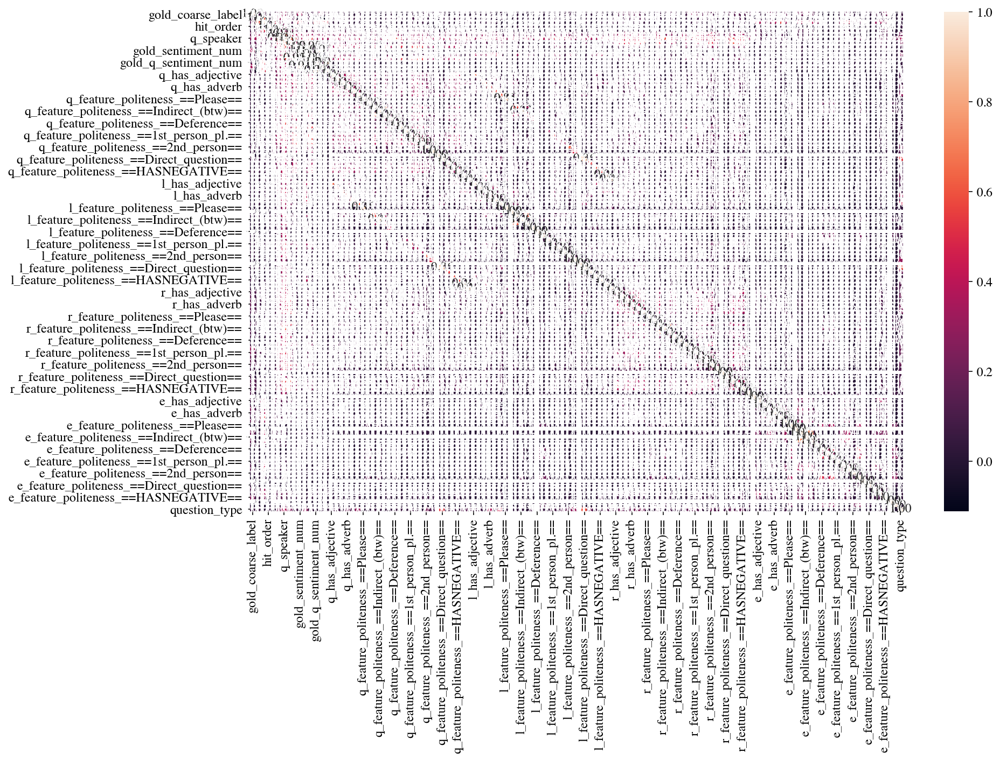

Theil's U


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


                                              gold_coarse_label  \
gold_coarse_label                                      1.000000   
gold_work_time                                         0.065962   
gold_worker                                            0.030252   
hit_order                                              0.037874   
gold_q_intent                                          0.006746   
hearing_id                                             0.032823   
q_speaker                                              0.056265   
r_text_len                                             0.160136   
q_text_len                                             0.095224   
gold_sentiment_num                                     0.354263   
q_text_last_question_len                               0.115230   
q_text_num_sents                                       0.091600   
gold_q_sentiment_num                                   0.114135   
gold_sentiment_coarse_num                              0.33780

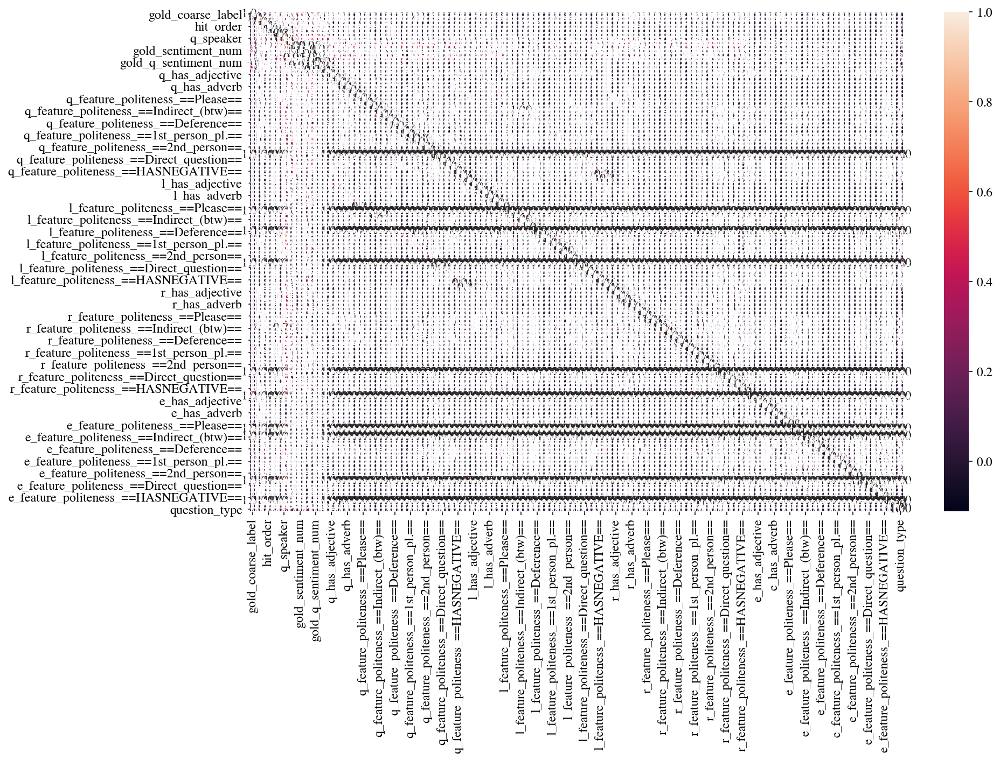

In [126]:
cont_corr_df = expanded_df[['gold_coarse_label', 'gold_work_time',
                                 'gold_worker', 
                                 'hit_order', 'gold_q_intent',
       'hearing_id','q_speaker', 
       #'gold_explanation_len',
       'r_text_len', 'q_text_len', 'gold_sentiment_num',
                                 'q_text_last_question_len','q_text_num_sents',
       'gold_q_sentiment_num', 'gold_sentiment_coarse_num',
       'gold_q_sentiment_coarse_num', 'q_has_adjective', 'q_has_cardinal_num', 'q_has_modal', 'q_has_adverb',
       'q_has_named_entity', 'q_question_lexicon',
       'q_feature_politeness_==Please==',
       'q_feature_politeness_==Please_start==',
       'q_feature_politeness_==HASHEDGE==',
       'q_feature_politeness_==Indirect_(btw)==',
       'q_feature_politeness_==Hedges==',
       'q_feature_politeness_==Factuality==',
       'q_feature_politeness_==Deference==',
       'q_feature_politeness_==Gratitude==',
       'q_feature_politeness_==Apologizing==',
       'q_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==1st_person==',
       'q_feature_politeness_==1st_person_start==',
       'q_feature_politeness_==2nd_person==',
       'q_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==Indirect_(greeting)==',
       'q_feature_politeness_==Direct_question==',
       'q_feature_politeness_==Direct_start==',
       'q_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==HASNEGATIVE==',
       'q_feature_politeness_==SUBJUNCTIVE==',
       'q_feature_politeness_==INDICATIVE==', 
       'l_has_adjective',
       'l_has_cardinal_num', 'l_has_modal', 'l_has_adverb',
       'l_has_named_entity', 'l_question_lexicon',
       'l_feature_politeness_==Please==',
       'l_feature_politeness_==Please_start==',
       'l_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==Indirect_(btw)==',
       'l_feature_politeness_==Hedges==',
       'l_feature_politeness_==Factuality==',
       'l_feature_politeness_==Deference==',
       'l_feature_politeness_==Gratitude==',
       'l_feature_politeness_==Apologizing==',
       'l_feature_politeness_==1st_person_pl.==',
       'l_feature_politeness_==1st_person==',
       'l_feature_politeness_==1st_person_start==',
       'l_feature_politeness_==2nd_person==',
       'l_feature_politeness_==2nd_person_start==',
       'l_feature_politeness_==Indirect_(greeting)==',
       'l_feature_politeness_==Direct_question==',
       'l_feature_politeness_==Direct_start==',
       'l_feature_politeness_==HASPOSITIVE==',
       'l_feature_politeness_==HASNEGATIVE==',
       'l_feature_politeness_==SUBJUNCTIVE==',
       'l_feature_politeness_==INDICATIVE==',                           
       'r_has_adjective',
       'r_has_cardinal_num', 'r_has_modal', 'r_has_adverb',
       'r_has_named_entity', 'r_question_lexicon',
       'r_feature_politeness_==Please==',
       'r_feature_politeness_==Please_start==',
       'r_feature_politeness_==HASHEDGE==',
       'r_feature_politeness_==Indirect_(btw)==',
       'r_feature_politeness_==Hedges==',
       'r_feature_politeness_==Factuality==',
       'r_feature_politeness_==Deference==',
       'r_feature_politeness_==Gratitude==',
       'r_feature_politeness_==Apologizing==',
       'r_feature_politeness_==1st_person_pl.==',
       'r_feature_politeness_==1st_person==',
       'r_feature_politeness_==1st_person_start==',
       'r_feature_politeness_==2nd_person==',
       'r_feature_politeness_==2nd_person_start==',
       'r_feature_politeness_==Indirect_(greeting)==',
       'r_feature_politeness_==Direct_question==',
       'r_feature_politeness_==Direct_start==',
       'r_feature_politeness_==HASPOSITIVE==',
       'r_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==SUBJUNCTIVE==',
       'r_feature_politeness_==INDICATIVE==', 'e_has_adjective',
       'e_has_cardinal_num', 'e_has_modal', 'e_has_adverb',
       'e_has_named_entity', 'e_question_lexicon',
       'e_feature_politeness_==Please==',
       'e_feature_politeness_==Please_start==',
       'e_feature_politeness_==HASHEDGE==',
       'e_feature_politeness_==Indirect_(btw)==',
       'e_feature_politeness_==Hedges==',
       'e_feature_politeness_==Factuality==',
       'e_feature_politeness_==Deference==',
       'e_feature_politeness_==Gratitude==',
       'e_feature_politeness_==Apologizing==',
       'e_feature_politeness_==1st_person_pl.==',
       'e_feature_politeness_==1st_person==',
       'e_feature_politeness_==1st_person_start==',
       'e_feature_politeness_==2nd_person==',
       'e_feature_politeness_==2nd_person_start==',
       'e_feature_politeness_==Indirect_(greeting)==',
       'e_feature_politeness_==Direct_question==',
       'e_feature_politeness_==Direct_start==',
       'e_feature_politeness_==HASPOSITIVE==',
       'e_feature_politeness_==HASNEGATIVE==',
       'e_feature_politeness_==SUBJUNCTIVE==',
       'e_feature_politeness_==INDICATIVE==',
        'question_type']]
cont_corr_df.reset_index(inplace=True,drop=True)
get_correlations(cont_corr_df, nominal_columns=['gold_coarse_label', 
                                 'gold_worker', 
                                  'gold_q_intent',
       'hearing_id','q_speaker', 
       #'gold_explanation_len',
        'q_has_adjective', 'q_has_cardinal_num', 'q_has_modal', 'q_has_adverb',
       'q_has_named_entity', 'q_question_lexicon',
       'q_feature_politeness_==Please==',
       'q_feature_politeness_==Please_start==',
       'q_feature_politeness_==HASHEDGE==',
       'q_feature_politeness_==Indirect_(btw)==',
       'q_feature_politeness_==Hedges==',
       'q_feature_politeness_==Factuality==',
       'q_feature_politeness_==Deference==',
       'q_feature_politeness_==Gratitude==',
       'q_feature_politeness_==Apologizing==',
       'q_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==1st_person==',
       'q_feature_politeness_==1st_person_start==',
       'q_feature_politeness_==2nd_person==',
       'q_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==Indirect_(greeting)==',
       'q_feature_politeness_==Direct_question==',
       'q_feature_politeness_==Direct_start==',
       'q_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==HASNEGATIVE==',
       'q_feature_politeness_==SUBJUNCTIVE==',
       'q_feature_politeness_==INDICATIVE==', 
       'l_has_adjective',
       'l_has_cardinal_num', 'l_has_modal', 'l_has_adverb',
       'l_has_named_entity', 'l_question_lexicon',
       'l_feature_politeness_==Please==',
       'l_feature_politeness_==Please_start==',
       'l_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==Indirect_(btw)==',
       'l_feature_politeness_==Hedges==',
       'l_feature_politeness_==Factuality==',
       'l_feature_politeness_==Deference==',
       'l_feature_politeness_==Gratitude==',
       'l_feature_politeness_==Apologizing==',
       'l_feature_politeness_==1st_person_pl.==',
       'l_feature_politeness_==1st_person==',
       'l_feature_politeness_==1st_person_start==',
       'l_feature_politeness_==2nd_person==',
       'l_feature_politeness_==2nd_person_start==',
       'l_feature_politeness_==Indirect_(greeting)==',
       'l_feature_politeness_==Direct_question==',
       'l_feature_politeness_==Direct_start==',
       'l_feature_politeness_==HASPOSITIVE==',
       'l_feature_politeness_==HASNEGATIVE==',
       'l_feature_politeness_==SUBJUNCTIVE==',
       'l_feature_politeness_==INDICATIVE==',                                          
       'r_has_adjective',
       'r_has_cardinal_num', 'r_has_modal', 'r_has_adverb',
       'r_has_named_entity', 'r_question_lexicon',
       'r_feature_politeness_==Please==',
       'r_feature_politeness_==Please_start==',
       'r_feature_politeness_==HASHEDGE==',
       'r_feature_politeness_==Indirect_(btw)==',
       'r_feature_politeness_==Hedges==',
       'r_feature_politeness_==Factuality==',
       'r_feature_politeness_==Deference==',
       'r_feature_politeness_==Gratitude==',
       'r_feature_politeness_==Apologizing==',
       'r_feature_politeness_==1st_person_pl.==',
       'r_feature_politeness_==1st_person==',
       'r_feature_politeness_==1st_person_start==',
       'r_feature_politeness_==2nd_person==',
       'r_feature_politeness_==2nd_person_start==',
       'r_feature_politeness_==Indirect_(greeting)==',
       'r_feature_politeness_==Direct_question==',
       'r_feature_politeness_==Direct_start==',
       'r_feature_politeness_==HASPOSITIVE==',
       'r_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==SUBJUNCTIVE==',
       'r_feature_politeness_==INDICATIVE==', 'e_has_adjective',
       'e_has_cardinal_num', 'e_has_modal', 'e_has_adverb',
       'e_has_named_entity', 'e_question_lexicon',
       'e_feature_politeness_==Please==',
       'e_feature_politeness_==Please_start==',
       'e_feature_politeness_==HASHEDGE==',
       'e_feature_politeness_==Indirect_(btw)==',
       'e_feature_politeness_==Hedges==',
       'e_feature_politeness_==Factuality==',
       'e_feature_politeness_==Deference==',
       'e_feature_politeness_==Gratitude==',
       'e_feature_politeness_==Apologizing==',
       'e_feature_politeness_==1st_person_pl.==',
       'e_feature_politeness_==1st_person==',
       'e_feature_politeness_==1st_person_start==',
       'e_feature_politeness_==2nd_person==',
       'e_feature_politeness_==2nd_person_start==',
       'e_feature_politeness_==Indirect_(greeting)==',
       'e_feature_politeness_==Direct_question==',
       'e_feature_politeness_==Direct_start==',
       'e_feature_politeness_==HASPOSITIVE==',
       'e_feature_politeness_==HASNEGATIVE==',
       'e_feature_politeness_==SUBJUNCTIVE==',
       'e_feature_politeness_==INDICATIVE==',
        'question_type'])


Cramer's V


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,
/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/dython/nominal.py:102: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))


                                              q_text_last_question_len  \
q_text_last_question_len                                      1.000000   
gold_labels_binary                                            0.223575   
q_text_len                                                    0.243269   
r_text_len                                                    0.175734   
l_has_adjective                                               0.372311   
l_has_cardinal_num                                            0.224525   
l_has_modal                                                   0.308070   
l_has_adverb                                                  0.412504   
l_has_named_entity                                            0.462052   
l_question_lexicon                                            0.244337   
l_feature_politeness_==Please==                               0.006950   
l_feature_politeness_==Please_start==                         0.000000   
l_feature_politeness_==HASHEDGE==     

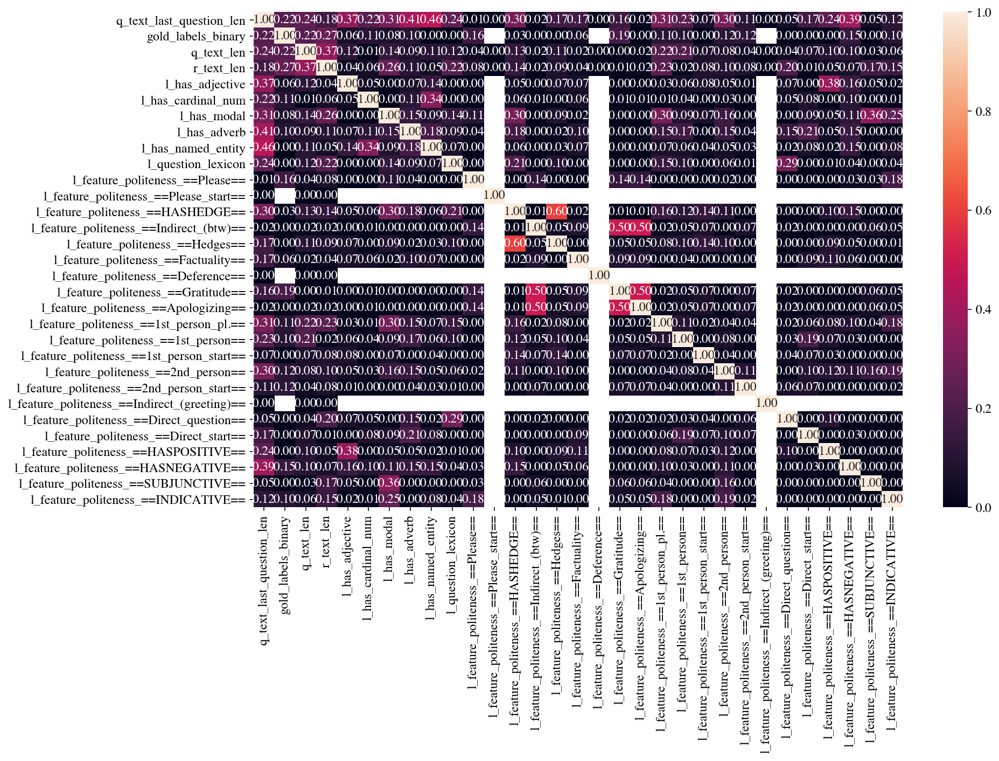

Theil's U


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


                                              q_text_last_question_len  \
q_text_last_question_len                                      1.000000   
gold_labels_binary                                            0.223575   
q_text_len                                                    0.243269   
r_text_len                                                    0.175734   
l_has_adjective                                               0.372311   
l_has_cardinal_num                                            0.224525   
l_has_modal                                                   0.308070   
l_has_adverb                                                  0.412504   
l_has_named_entity                                            0.462052   
l_question_lexicon                                            0.244337   
l_feature_politeness_==Please==                               0.006950   
l_feature_politeness_==Please_start==                         0.000000   
l_feature_politeness_==HASHEDGE==     

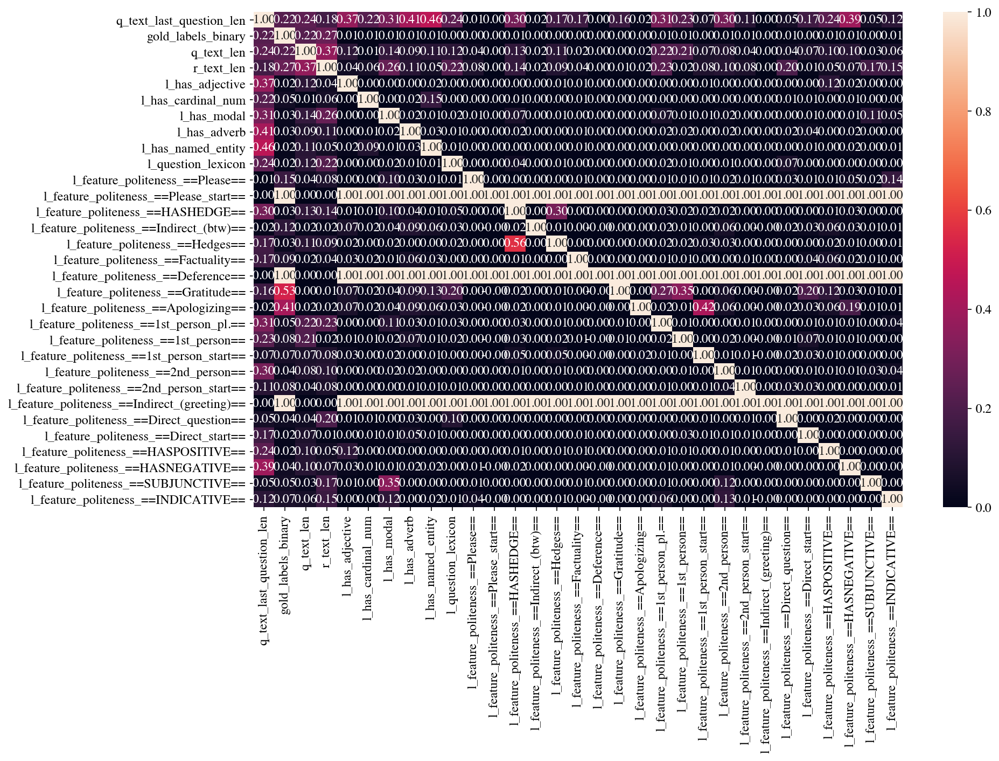

In [130]:
corr_gold_df = gold_df[['q_text_last_question_len', 'gold_labels_binary','q_text_len',
                        'r_text_len',
                       'l_has_adjective',
       'l_has_cardinal_num', 'l_has_modal', 'l_has_adverb',
       'l_has_named_entity', 'l_question_lexicon',
       'l_feature_politeness_==Please==',
       'l_feature_politeness_==Please_start==',
       'l_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==Indirect_(btw)==',
       'l_feature_politeness_==Hedges==',
       'l_feature_politeness_==Factuality==',
       'l_feature_politeness_==Deference==',
       'l_feature_politeness_==Gratitude==',
       'l_feature_politeness_==Apologizing==',
       'l_feature_politeness_==1st_person_pl.==',
       'l_feature_politeness_==1st_person==',
       'l_feature_politeness_==1st_person_start==',
       'l_feature_politeness_==2nd_person==',
       'l_feature_politeness_==2nd_person_start==',
       'l_feature_politeness_==Indirect_(greeting)==',
       'l_feature_politeness_==Direct_question==',
       'l_feature_politeness_==Direct_start==',
       'l_feature_politeness_==HASPOSITIVE==',
       'l_feature_politeness_==HASNEGATIVE==',
       'l_feature_politeness_==SUBJUNCTIVE==',
       'l_feature_politeness_==INDICATIVE==']]
get_correlations(corr_gold_df, nominal_columns=['gold_labels_binary',
                                                'l_has_adjective',
       'l_has_cardinal_num', 'l_has_modal', 'l_has_adverb',
       'l_has_named_entity', 'l_question_lexicon',
       'l_feature_politeness_==Please==',
       'l_feature_politeness_==Please_start==',
       'l_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==Indirect_(btw)==',
       'l_feature_politeness_==Hedges==',
       'l_feature_politeness_==Factuality==',
       'l_feature_politeness_==Deference==',
       'l_feature_politeness_==Gratitude==',
       'l_feature_politeness_==Apologizing==',
       'l_feature_politeness_==1st_person_pl.==',
       'l_feature_politeness_==1st_person==',
       'l_feature_politeness_==1st_person_start==',
       'l_feature_politeness_==2nd_person==',
       'l_feature_politeness_==2nd_person_start==',
       'l_feature_politeness_==Indirect_(greeting)==',
       'l_feature_politeness_==Direct_question==',
       'l_feature_politeness_==Direct_start==',
       'l_feature_politeness_==HASPOSITIVE==',
       'l_feature_politeness_==HASNEGATIVE==',
       'l_feature_politeness_==SUBJUNCTIVE==',
       'l_feature_politeness_==INDICATIVE=='])

Cramer's V


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,
/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/dython/nominal.py:102: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))
/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/dython/nominal.py:102: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))


                                              hearing_id  q_speaker  \
hearing_id                                      1.000000   0.729421   
q_speaker                                       0.729421   1.000000   
q_has_modal                                     0.288236   0.292213   
q_has_adjective                                 0.212882   0.188374   
q_has_cardinal_num                              0.162529   0.249434   
q_has_adverb                                    0.148038   0.126120   
q_has_named_entity                              0.212719   0.196266   
q_question_lexicon                              0.212500   0.258735   
q_feature_politeness_==Please==                 0.000000   0.000000   
q_feature_politeness_==Please_start==           0.000000   0.000000   
q_feature_politeness_==HASHEDGE==               0.242050   0.307262   
q_feature_politeness_==Indirect_(btw)==         0.000000   0.000000   
q_feature_politeness_==Hedges==                 0.213927   0.339230   
q_feat

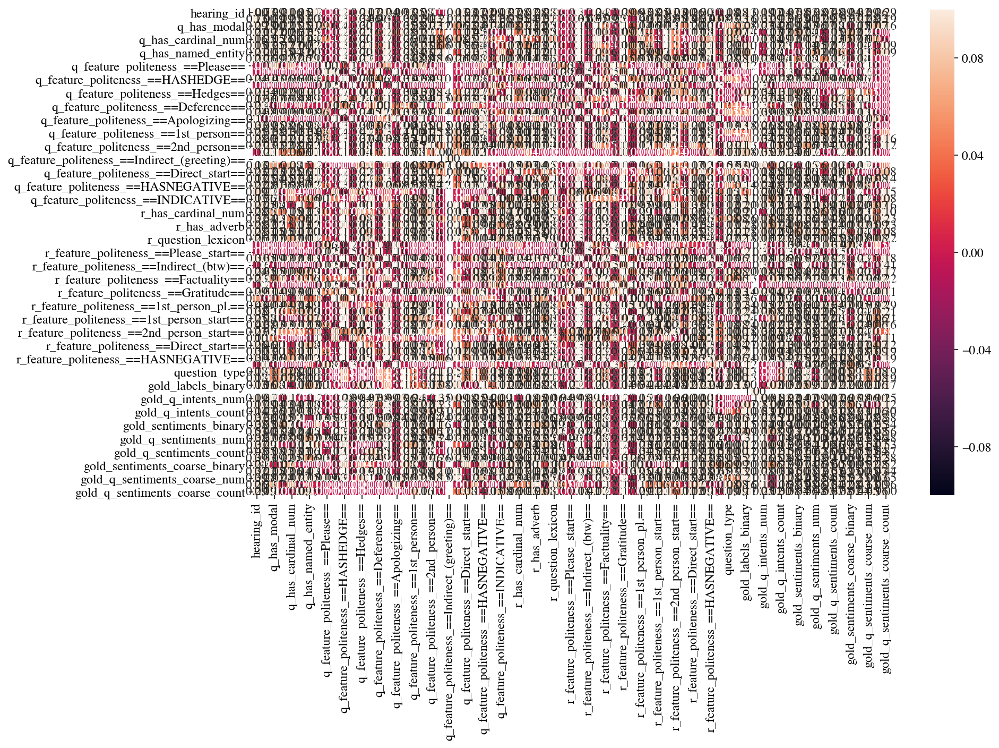

Theil's U


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


                                              hearing_id  q_speaker  \
hearing_id                                      1.000000   0.797750   
q_speaker                                       0.569111   1.000000   
q_has_modal                                     0.076954   0.160793   
q_has_adjective                                 0.062536   0.154708   
q_has_cardinal_num                              0.033931   0.140221   
q_has_adverb                                    0.040265   0.137566   
q_has_named_entity                              0.052727   0.135643   
q_question_lexicon                              0.047326   0.144489   
q_feature_politeness_==Please==                 0.095360   0.319344   
q_feature_politeness_==Please_start==           0.380069   0.411853   
q_feature_politeness_==HASHEDGE==               0.060237   0.174265   
q_feature_politeness_==Indirect_(btw)==         0.380069   0.511580   
q_feature_politeness_==Hedges==                 0.062909   0.211762   
q_feat

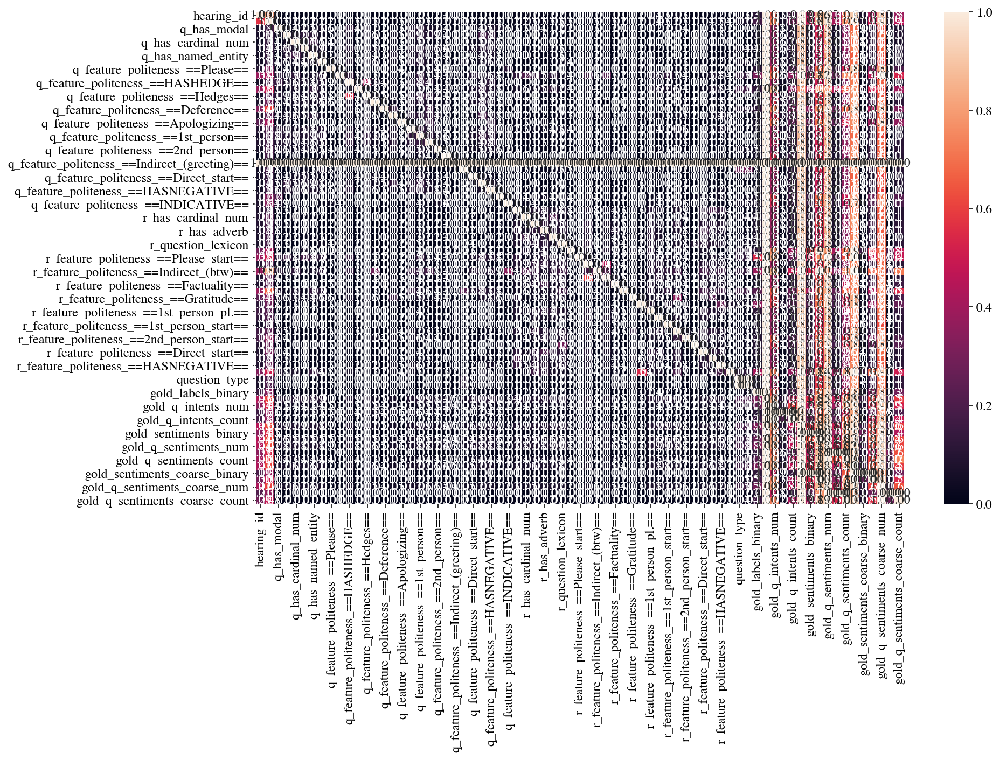

In [131]:
corr_gold_df = gold_df[['hearing_id', 'q_speaker',
       #'gold_workers', 'gold_sentiments',
       #'gold_qa_orders', 'gold_q_intents', 'gold_q_sentiments',
       #'gold_work_times',  
       'q_has_modal',
       #'e_feature_politeness_==HASNEGATIVE==', 
       'q_has_adjective',
       'q_has_cardinal_num', 'q_has_adverb', 'q_has_named_entity',
       'q_question_lexicon', 'q_feature_politeness_==Please==',
       'q_feature_politeness_==Please_start==',
       'q_feature_politeness_==HASHEDGE==',
       'q_feature_politeness_==Indirect_(btw)==',
       'q_feature_politeness_==Hedges==',
       'q_feature_politeness_==Factuality==',
       'q_feature_politeness_==Deference==',
       'q_feature_politeness_==Gratitude==',
       'q_feature_politeness_==Apologizing==',
       'q_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==1st_person==',
       'q_feature_politeness_==1st_person_start==',
       'q_feature_politeness_==2nd_person==',
       'q_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==Indirect_(greeting)==', # 0 count
       'q_feature_politeness_==Direct_question==',
       'q_feature_politeness_==Direct_start==',
       'q_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==HASNEGATIVE==',
       'q_feature_politeness_==SUBJUNCTIVE==',
       'q_feature_politeness_==INDICATIVE==', 'r_has_adjective',
       'r_has_cardinal_num', 'r_has_modal', 'r_has_adverb',
       'r_has_named_entity', 'r_question_lexicon',
       'r_feature_politeness_==Please==',
       'r_feature_politeness_==Please_start==',
       'r_feature_politeness_==HASHEDGE==',
       'r_feature_politeness_==Indirect_(btw)==',
       'r_feature_politeness_==Hedges==',
       'r_feature_politeness_==Factuality==',
       'r_feature_politeness_==Deference==',
       'r_feature_politeness_==Gratitude==',
       'r_feature_politeness_==Apologizing==',
       'r_feature_politeness_==1st_person_pl.==',
       'r_feature_politeness_==1st_person==',
       'r_feature_politeness_==1st_person_start==',
       'r_feature_politeness_==2nd_person==',
       'r_feature_politeness_==2nd_person_start==',
       #'r_feature_politeness_==Indirect_(greeting)==',  0 count
       'r_feature_politeness_==Direct_question==',
       'r_feature_politeness_==Direct_start==',
       'r_feature_politeness_==HASPOSITIVE==',
       'r_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==SUBJUNCTIVE==',
       #'r_feature_politeness_==INDICATIVE==',  0 count
       'question_type', 'question_type_num',
       #'e_has_adjective', 'e_has_cardinal_num', 'e_has_modal', 'e_has_adverb',
       #'e_has_named_entity', 'e_question_lexicon',
       #'e_feature_politeness_==Please==',
       #'e_feature_politeness_==Please_start==', 0 count
       #'e_feature_politeness_==HASHEDGE==',
       #'e_feature_politeness_==Indirect_(btw)==', 0 count
       #'e_feature_politeness_==Hedges==',
       #'e_feature_politeness_==Factuality==',
       #'e_feature_politeness_==Deference==',
       #'e_feature_politeness_==Gratitude==',
       #'e_feature_politeness_==Apologizing==',
       #'e_feature_politeness_==1st_person_pl.==',
       #'e_feature_politeness_==1st_person==',
       #'e_feature_politeness_==1st_person_start==',
       #'e_feature_politeness_==2nd_person==',
       #'e_feature_politeness_==2nd_person_start==',
       #'e_feature_politeness_==Indirect_(greeting)==', 0 count
       #'e_feature_politeness_==Direct_question==',
       #'e_feature_politeness_==Direct_start==',
       #'e_feature_politeness_==HASPOSITIVE==',
       #'e_feature_politeness_==SUBJUNCTIVE==', 0 count
       #'e_feature_politeness_==INDICATIVE==', 
       'gold_labels_binary',
       'qa_index_digits', 
       'gold_q_intents_num', 'gold_q_intents_binary', 'gold_q_intents_count', 
       'gold_sentiments_num', 'gold_sentiments_binary', 'gold_sentiments_count',
       'gold_q_sentiments_num', 'gold_q_sentiments_binary', 'gold_q_sentiments_count',
       'gold_sentiments_coarse_num', 'gold_sentiments_coarse_binary', 'gold_sentiments_coarse_count',
       'gold_q_sentiments_coarse_num', 'gold_q_sentiments_coarse_binary', 'gold_q_sentiments_coarse_count']]
get_correlations(corr_gold_df, nominal_columns='all')

## Q4: How does sentiment change over hearing?

In [132]:
worker_to_color = {}
worker_colors = (plt.get_cmap('tab20b').colors)+(plt.get_cmap('tab20c').colors)+(plt.get_cmap('tab20b').colors+(plt.get_cmap('tab20c').colors))
for idx, worker in enumerate(expanded_df.sort_values(by=['gold_worker'])['gold_worker'].unique()):
    worker_to_color[worker] = worker_colors[idx]
    
def plot_sentiment_time(df, column):        
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        subplot_sentiment_time(axes[row_idx, col_idx], group, column, plot_title, worker_to_color)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()
    
def subplot_sentiment_time(ax, df, column, plot_title, worker_to_color):
    qas = df.sort_values(by=['qa_index'])['qa_index'].unique()
    workers = df['gold_worker'].unique()
    for worker in workers:
        worker_qas = df[df['gold_worker']==worker].sort_values(by=['qa_index'])['qa_index'].unique()
        x = []
        y = []
        for worker_qa in worker_qas:
            x.append(np.where(qas==worker_qa)[0][0])
            y.append(df[(df['gold_worker']==worker) & (df['qa_index']==worker_qa)][column].values[0])
        #print('going to plot x', x, 'and y', y)
        ax.plot(x, y, color=worker_to_color[worker],marker='.')

    #ax.set_yticklabels(range(-3,4,1))
    ax.set_ylim(-4, 4)
    ax.set_title(plot_title)
    ax.set_ylabel('Sentiment')
    #y = [len(labels) for labels in df[column].values]
    #x = range(1,51)
    #ax.plot(x,y,marker='o', linestyle=':')

In [133]:
def plot_sentiment_change_time(df, column):
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        #print('hearing', plot_title)
        subplot_sentiment_change_time(axes[row_idx, col_idx], group, column, plot_title, worker_to_color)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()

workerhearing_to_num_sentiment_changes = collections.defaultdict(int)
workerhearing_to_num_sentiment_flips = collections.defaultdict(int)
def subplot_sentiment_change_time(ax, df, column, plot_title, worker_to_color):
    hearing_id = df['hearing_id'].unique()[0]
    print(hearing_id)
    worker_to_prev_sentiment = {}
    hearing_workers = df['gold_worker'].unique()
    for worker in hearing_workers:
        x=[]
        y=[]
        #print('worker ', worker)
        for idx, qa in enumerate(df.sort_values(by=['qa_index'])['qa_index'].unique()):
            #print('index', idx, 'qa', qa)
            qa_workers = df[df['qa_index']==qa]['gold_worker'].unique()
            curr_sentiment = None
            new_change_count = None
            if worker in qa_workers:
                if worker+':'+hearing_id not in workerhearing_to_num_sentiment_flips:
                    workerhearing_to_num_sentiment_flips[worker+':'+hearing_id]=0
                if worker+':'+hearing_id not in workerhearing_to_num_sentiment_changes:
                    workerhearing_to_num_sentiment_changes[worker+':'+hearing_id]=0
                #print('worker annotated question')
                curr_sentiment = df[(df['gold_worker']==worker) & (df['qa_index']==qa)][column].values[0]
                #print('curr sentiment', curr_sentiment)
                if worker in worker_to_prev_sentiment:
                    #print('worker has prev sent')
                    prev_sentiment = worker_to_prev_sentiment[worker]
                    max_change_count = max((count for count in y if count is not None), default=None)
                    #print('current max change count is', max_change_count)
                    if max_change_count is None:
                        #print('setting max change count to 0 because all None in y')
                        max_change_count = 0
                    if prev_sentiment and prev_sentiment != curr_sentiment:
                        #print('found change in sentiment!')
                        if ('ositive' in prev_sentiment and 'egative' in curr_sentiment) or ('egative' in prev_sentiment and 'ositive' in curr_sentiment):
                            new_change_count = max_change_count + 1
                            workerhearing_to_num_sentiment_flips[worker+':'+hearing_id] += 1
                        else:
                            new_change_count = max_change_count + 0
                            workerhearing_to_num_sentiment_changes[worker+':'+hearing_id] += 1
                    else:
                        new_change_count = max_change_count
                    #print('new change count is now', new_change_count)
                else:
                    #print('worker has no prev sent')
                    new_change_count = 0
                worker_to_prev_sentiment[worker] = curr_sentiment
            else:
                #print('worker did not annotate question')
                new_change_count = None
            x.append(idx)
            #print('added change count value', new_change_count)
            y.append(new_change_count)
        #if '88494' in plot_title:
        #    print('going to plot x', x, 'and y', y)
        ax.plot(x, y, color=worker_to_color[worker],marker='.')
    ax.set_ylim(0, 9)
    ax.set_title(plot_title)
    ax.set_ylabel(r'$\Delta$' ' sentiment')
 

CHRG-113hhrg86195
CHRG-113hhrg88494
CHRG-113hhrg89598
CHRG-113hhrg93834
CHRG-114hhrg20722
CHRG-114hhrg22125
CHRG-114hhrg26003
CHRG-114hhrg95063
CHRG-114hhrg97630
CHRG-115hhrg25545
CHRG-115hhrg30242
CHRG-115hhrg30956
CHRG-115hhrg31349
CHRG-115hhrg31417
CHRG-115hhrg31504
CHRG-115hhrg32380
CHRG-116hhrg35230
CHRG-116hhrg35589
CHRG-116hhrg36001
CHRG-116hhrg37282


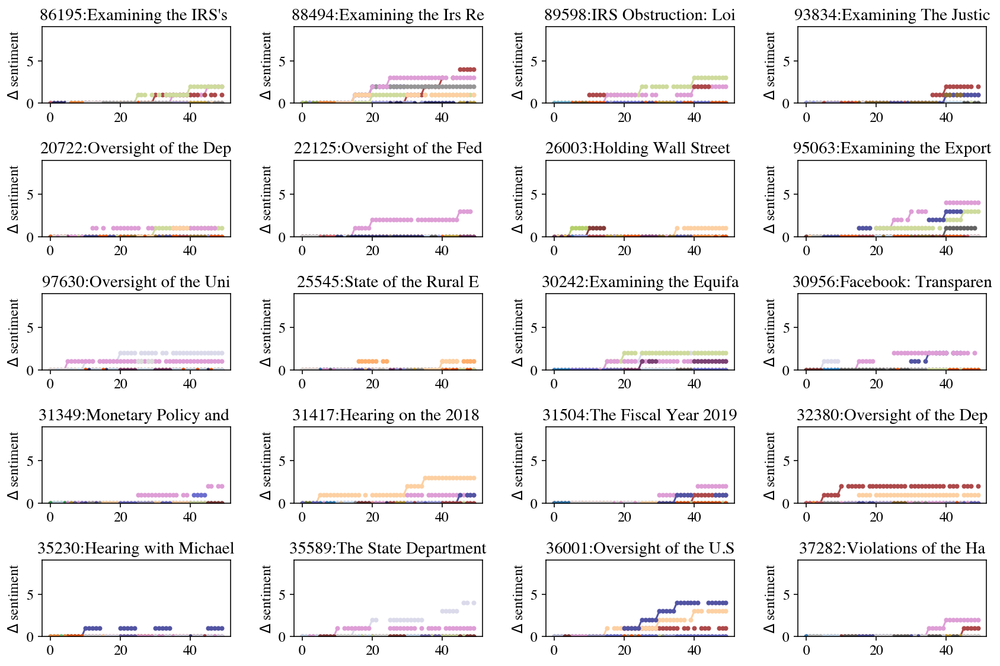

In [134]:
plot_sentiment_change_time(expanded_df, 'gold_sentiment_coarse')

In [135]:
workerhearing_to_num_sentiment_changes

defaultdict(int,
            {'worker_60:CHRG-113hhrg86195': 0,
             'worker_48:CHRG-113hhrg86195': 0,
             'worker_14:CHRG-113hhrg86195': 0,
             'worker_63:CHRG-113hhrg86195': 0,
             'worker_43:CHRG-113hhrg86195': 0,
             'worker_21:CHRG-113hhrg86195': 0,
             'worker_0:CHRG-113hhrg86195': 0,
             'worker_3:CHRG-113hhrg86195': 0,
             'worker_40:CHRG-113hhrg86195': 0,
             'worker_50:CHRG-113hhrg86195': 0,
             'worker_56:CHRG-113hhrg86195': 0,
             'worker_31:CHRG-113hhrg86195': 0,
             'worker_62:CHRG-113hhrg86195': 2,
             'worker_9:CHRG-113hhrg86195': 4,
             'worker_20:CHRG-113hhrg86195': 2,
             'worker_30:CHRG-113hhrg86195': 0,
             'worker_51:CHRG-113hhrg86195': 0,
             'worker_39:CHRG-113hhrg86195': 0,
             'worker_42:CHRG-113hhrg86195': 2,
             'worker_6:CHRG-113hhrg86195': 0,
             'worker_44:CHRG-113hhrg86195': 0,


In [136]:
workerhearing_to_num_sentiment_flips

defaultdict(int,
            {'worker_60:CHRG-113hhrg86195': 0,
             'worker_48:CHRG-113hhrg86195': 0,
             'worker_14:CHRG-113hhrg86195': 0,
             'worker_63:CHRG-113hhrg86195': 0,
             'worker_43:CHRG-113hhrg86195': 0,
             'worker_21:CHRG-113hhrg86195': 0,
             'worker_0:CHRG-113hhrg86195': 0,
             'worker_3:CHRG-113hhrg86195': 0,
             'worker_40:CHRG-113hhrg86195': 0,
             'worker_50:CHRG-113hhrg86195': 0,
             'worker_56:CHRG-113hhrg86195': 0,
             'worker_31:CHRG-113hhrg86195': 0,
             'worker_62:CHRG-113hhrg86195': 2,
             'worker_9:CHRG-113hhrg86195': 0,
             'worker_20:CHRG-113hhrg86195': 1,
             'worker_30:CHRG-113hhrg86195': 0,
             'worker_51:CHRG-113hhrg86195': 2,
             'worker_39:CHRG-113hhrg86195': 0,
             'worker_42:CHRG-113hhrg86195': 0,
             'worker_6:CHRG-113hhrg86195': 0,
             'worker_44:CHRG-113hhrg86195': 0,


In [137]:
worker_to_num_flips = collections.defaultdict(int)
hearing_to_num_flips = collections.defaultdict(int)
for workerhearing, num_flips in workerhearing_to_num_sentiment_flips.items():
    parts = workerhearing.split(':')
    worker = parts[0]
    hearing = parts[1]
    worker_to_num_flips[worker] += num_flips
    hearing_to_num_flips[hearing] += num_flips
(np.array(list(worker_to_num_flips.values()))>0).sum()

15

In [138]:
worker_to_num_changes = collections.defaultdict(int)
hearing_to_num_changes = collections.defaultdict(int)
for workerhearing, num_changes in workerhearing_to_num_sentiment_changes.items():
    parts = workerhearing.split(':')
    worker = parts[0]
    hearing = parts[1]
    worker_to_num_changes[worker] += num_changes
    hearing_to_num_changes[hearing] += num_changes
(np.array(list(worker_to_num_changes.values()))>0).sum()

23

In [139]:
#{k: v for k, v in sorted(hearing_to_num_flips.items(), key=lambda item: item[1])}
df_flips = pd.DataFrame(hearing_to_num_flips.items(),columns=['hearing_id','num_flips'])
df_changes = pd.DataFrame(hearing_to_num_changes.items(),columns=['hearing_id','num_changes'])

In [140]:
df_flips.sort_values(by=['num_flips'])

,hearing_id,num_flips
16,CHRG-116hhrg35230,1
9,CHRG-115hhrg25545,2
15,CHRG-115hhrg32380,3
12,CHRG-115hhrg31349,3
6,CHRG-114hhrg26003,3
19,CHRG-116hhrg37282,3
4,CHRG-114hhrg20722,3
5,CHRG-114hhrg22125,3
8,CHRG-114hhrg97630,4
14,CHRG-115hhrg31504,4


In [141]:
df_changes.sort_values(by=['num_changes'])

,hearing_id,num_changes
6,CHRG-114hhrg26003,5
13,CHRG-115hhrg31417,6
14,CHRG-115hhrg31504,7
11,CHRG-115hhrg30956,7
16,CHRG-116hhrg35230,8
7,CHRG-114hhrg95063,9
0,CHRG-113hhrg86195,10
19,CHRG-116hhrg37282,11
18,CHRG-116hhrg36001,12
17,CHRG-116hhrg35589,12


In [142]:
direct_answers_series = expanded_df[expanded_df['gold_coarse_label']=='answer'].groupby(['hearing_id'])['qa_index'].count()
flips_answers_df = pd.merge(df_flips, direct_answers_series, left_on='hearing_id', right_index=True)
changes_answers_df = pd.merge(df_changes, direct_answers_series, left_on='hearing_id', right_index=True)

In [143]:
flips_answers = flips_answers_df[['num_flips','qa_index']].values
changes_answers = changes_answers_df[['num_changes','qa_index']].values

In [144]:
num_flips, num_answers = list(zip(*flips_answers))
from scipy.stats import pearsonr
pearsonr(num_flips, num_answers)

(0.04497235956870227, 0.8506674311310723)

In [145]:
num_changes, num_answers = list(zip(*changes_answers))
from scipy.stats import pearsonr
pearsonr(num_changes, num_answers)

(0.07235609065736776, 0.7617769463597727)

In [146]:
(expanded_df.groupby(['gold_worker'])['gold_hit_id'].count()>5).sum()

39

In [147]:
worker_to_hit_ids = expanded_df.groupby(['gold_worker'])['gold_hit_id'].unique().to_dict()
worker_to_num_hits = {}
for worker, hits in worker_to_hit_ids.items():
    worker_to_num_hits[worker] = len(hits)


In [148]:
worker_to_sent_change_ratio={}
for worker, num_changes in worker_to_num_changes.items():
    worker_to_sent_change_ratio[worker] = num_changes/worker_to_num_hits[worker]

In [149]:
worker_to_sent_change_ratio

{'worker_60': 0.0,
 'worker_48': 0.23076923076923078,
 'worker_14': 0.0,
 'worker_63': 0.0,
 'worker_43': 0.07407407407407407,
 'worker_21': 0.3,
 'worker_0': 0.02247191011235955,
 'worker_3': 0.08333333333333333,
 'worker_40': 0.03636363636363636,
 'worker_50': 0.0,
 'worker_56': 0.06666666666666667,
 'worker_31': 0.0,
 'worker_62': 0.2777777777777778,
 'worker_9': 0.2875,
 'worker_20': 0.4,
 'worker_30': 0.2376237623762376,
 'worker_51': 0.3493150684931507,
 'worker_39': 0.0625,
 'worker_42': 0.16666666666666666,
 'worker_6': 0.1111111111111111,
 'worker_44': 0.16,
 'worker_53': 0.0,
 'worker_23': 0.0,
 'worker_5': 0.0,
 'worker_1': 0.07142857142857142,
 'worker_36': 0.0,
 'worker_47': 0.13636363636363635,
 'worker_16': 0.0,
 'worker_4': 0.0,
 'worker_13': 0.0,
 'worker_15': 0.0,
 'worker_35': 0.0,
 'worker_28': 0.0,
 'worker_41': 0.0761904761904762,
 'worker_52': 0.041666666666666664,
 'worker_61': 0.0,
 'worker_8': 0.3,
 'worker_45': 0.0,
 'worker_18': 0.0,
 'worker_55': 0.0,
 'wor

In [150]:
worker_to_sent_flip_ratio={}
for worker, num_flips in worker_to_num_flips.items():
    worker_to_sent_flip_ratio[worker] = num_flips/worker_to_num_hits[worker]
worker_to_sent_flip_ratio

{'worker_60': 0.0,
 'worker_48': 0.0,
 'worker_14': 0.16666666666666666,
 'worker_63': 0.0,
 'worker_43': 0.0,
 'worker_21': 0.0,
 'worker_0': 0.0,
 'worker_3': 0.0,
 'worker_40': 0.18181818181818182,
 'worker_50': 0.0,
 'worker_56': 0.03333333333333333,
 'worker_31': 0.0,
 'worker_62': 0.19444444444444445,
 'worker_9': 0.15,
 'worker_20': 0.11666666666666667,
 'worker_30': 0.0,
 'worker_51': 0.0821917808219178,
 'worker_39': 0.0,
 'worker_42': 0.037037037037037035,
 'worker_6': 0.05555555555555555,
 'worker_44': 0.04,
 'worker_53': 0.0,
 'worker_23': 0.0,
 'worker_5': 0.0,
 'worker_1': 0.26785714285714285,
 'worker_36': 0.0,
 'worker_47': 0.045454545454545456,
 'worker_16': 0.0,
 'worker_4': 0.0,
 'worker_13': 0.0,
 'worker_15': 0.0,
 'worker_35': 0.0,
 'worker_28': 0.0,
 'worker_41': 0.009523809523809525,
 'worker_52': 0.041666666666666664,
 'worker_61': 0.0,
 'worker_8': 0.1,
 'worker_45': 0.0,
 'worker_18': 0.0,
 'worker_55': 0.0,
 'worker_2': 0.0,
 'worker_7': 0.0,
 'worker_38': 0

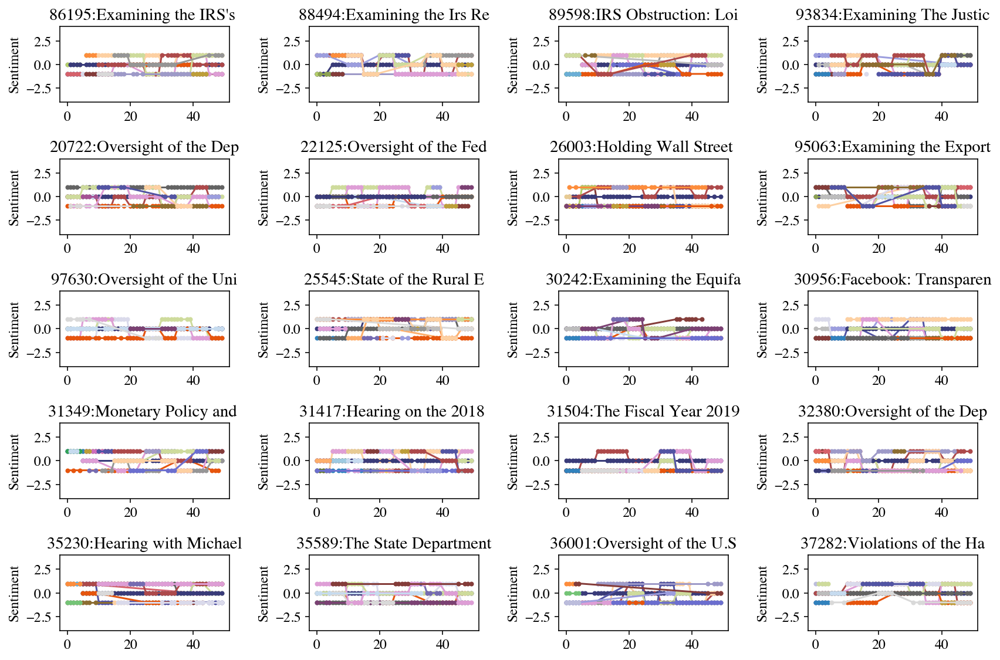

In [151]:
plot_sentiment_time(expanded_df, 'gold_sentiment_coarse_num')

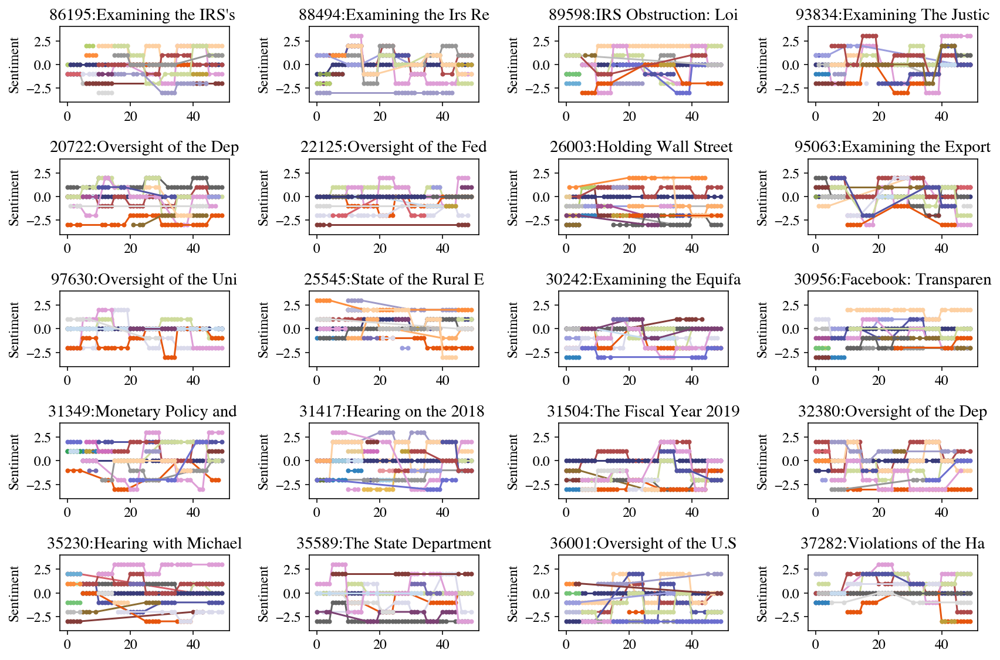

In [152]:
plot_sentiment_time(expanded_df, 'gold_sentiment_num')

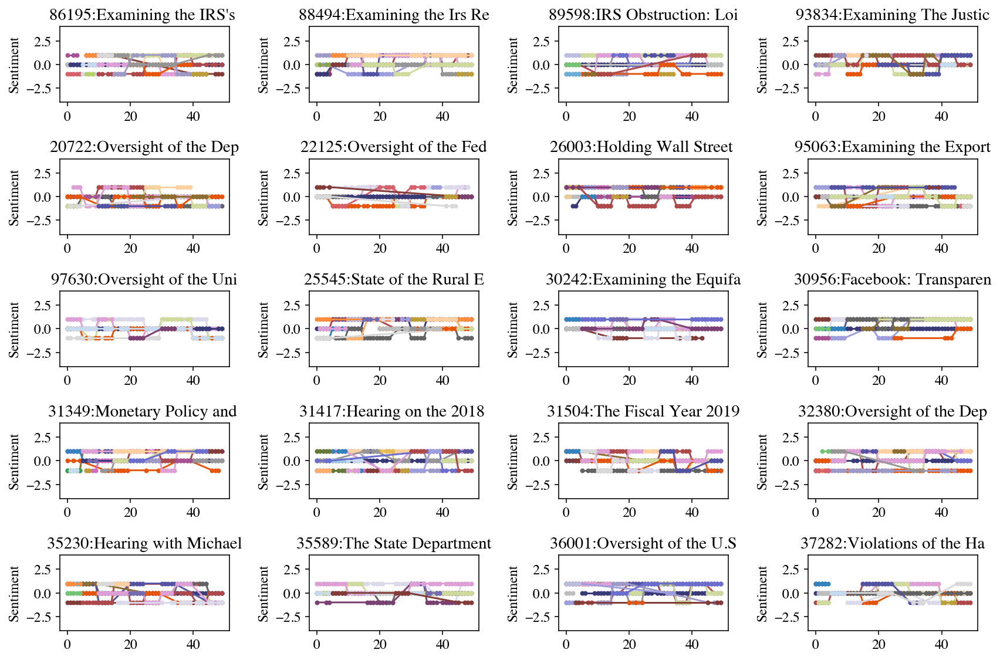

In [153]:
plot_sentiment_time(expanded_df, 'gold_q_sentiment_coarse_num')

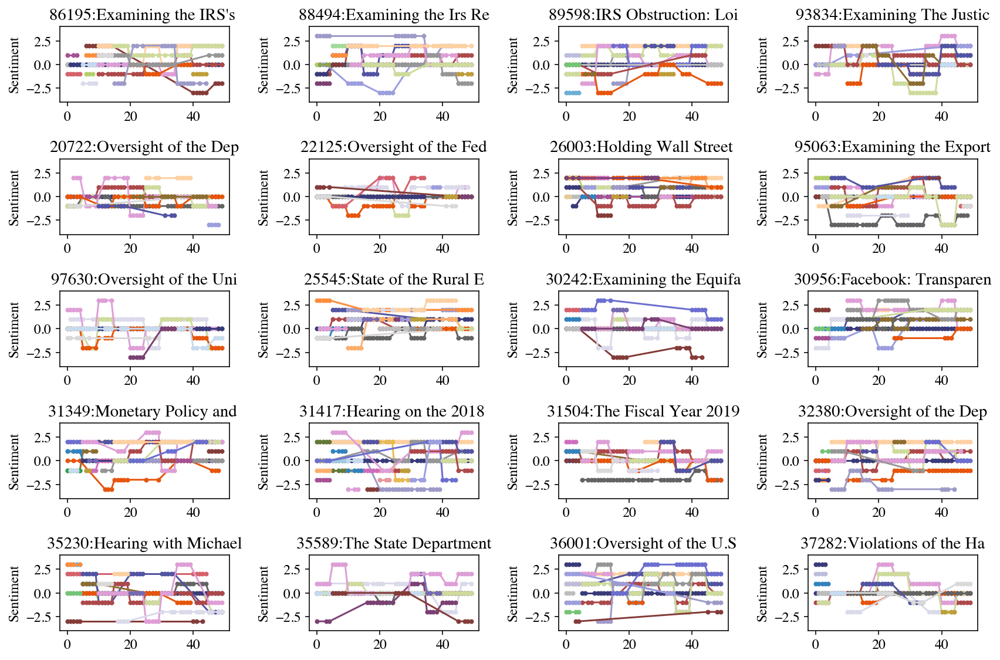

In [154]:
plot_sentiment_time(expanded_df, 'gold_q_sentiment_num')

## Q5: Are there words indicative of labels?

In [155]:
class PmiLmiCalculator(object):
    def __init__(self):
        self.label_to_counts = {}
        self.word_to_index = {}
        self.all_counts = {}
        self.vectorizer = None
        
    def get_highest_pmi_lmi(self, df, text_column, label_column, label, save_file, n_gram, min_freq, top_k=20):
        print('Calculating PMI and LMI for label', label, 'with ngram', n_gram, 'min freq', min_freq)
        self.set_all_counts_and_index(df, text_column, n_gram, min_freq)
        self.set_label_counts(df, text_column, label_column, label)
        matrix_pmi, matrix_lmi = self.calculate_pmi_lmi(self.label_to_counts[label])

        sorted_pmi = np.array(np.argsort(matrix_pmi)).reshape(-1, )  # from lowest to highest
        sorted_pmi = sorted_pmi[::-1]  # reverse, from highest to lowest
        sorted_pmi_words = [self.lookup_value(self.word_to_index, index) for index in sorted_pmi]
        sorted_pmi_scores = np.array(matrix_pmi[0,sorted_pmi]).reshape(-1, )*10**4
        sorted_pmi_freqs = np.array(self.label_to_counts[label][:,sorted_pmi].sum(axis=0)).reshape(-1,)
        sorted_pmi_tuples = list(zip(sorted_pmi_scores, sorted_pmi_words, sorted_pmi_freqs))
        with open(save_file+'_pmi.csv','w') as out:
            csv_out=csv.writer(out)
            csv_out.writerow(['pmi_score','word', 'frequency'])
            for row in sorted_pmi_tuples:
                csv_out.writerow(row)
        print('Saved PMI scores to ', save_file+'_pmi.csv')

        top_k_pmi_words = sorted_pmi_tuples[:top_k]

        sorted_lmi = np.array(np.argsort(matrix_lmi)).reshape(-1, )  # from lowest to highest
        sorted_lmi = sorted_lmi[::-1]  # reverse, from highest to lowest
        sorted_lmi_words = [self.lookup_value(self.word_to_index, index) for index in sorted_lmi]
        sorted_lmi_scores = np.array(matrix_lmi[0,sorted_lmi]).reshape(-1, )*10**4
        sorted_lmi_freqs = np.array(self.label_to_counts[label][:,sorted_lmi].sum(axis=0)).reshape(-1,)
        sorted_lmi_tuples = list(zip(sorted_lmi_scores, sorted_lmi_words, sorted_lmi_freqs))
        # move nan's to the end of the list
        sorted_lmi_tuples = sorted(sorted_lmi_tuples, key=lambda x: np.isnan(x[0])) 

        with open(save_file+'_lmi.csv','w') as out:
            csv_out=csv.writer(out)
            csv_out.writerow(['lmi_score','word', 'frequency'])
            for row in sorted_lmi_tuples:
                csv_out.writerow(row)
        print('Saved LMI scores to ', save_file+'_lmi.csv')
        top_k_lmi_words = sorted_lmi_tuples[:top_k]

        return top_k_pmi_words, top_k_lmi_words

    def lookup_value(self, _dict, _value):
        return next(key for key, value in _dict.items() if value == _value)

    def set_all_counts_and_index(self, df, text_column, n_gram, min_freq):
        print('inside set')
        if not self.word_to_index:
            print('Creating counter for words...')
            vocab_vectorizer = CountVectorizer(ngram_range=(n_gram, n_gram), tokenizer=tokenize_text, 
                                               min_df=min_freq)#token_pattern='*', 
            vocab_vectorizer.fit_transform(df[text_column].values)
            fixed_vocab = list(vocab_vectorizer.vocabulary_.keys())
            self.vectorizer = CountVectorizer(ngram_range=(n_gram, n_gram), tokenizer=tokenize_text, 
                                         vocabulary=fixed_vocab, #token_pattern='*', 
                                         lowercase=False, min_df=min_freq)
            self.all_counts = self.vectorizer.fit_transform(df[text_column].values)
            self.word_to_index = self.vectorizer.vocabulary_
            print('Created counter for all words with vocab of size', len(self.word_to_index.keys()))

    def set_label_counts(self, df, text_column, label_column, label):
        if label not in self.label_to_counts:
            print('Getting word counts for label...')
            label_counts = self.vectorizer.fit_transform(df[df[label_column]==label][text_column].values) 
            self.label_to_counts[label] = label_counts

    # p (w,l) = count(w,l) / |D|
    # p(l) = count(l) / |D|
    # p (l|w) = count(w,l) / count(w)
    # PMI = log ( p(l|w) / p(l) )
    # LMI = p(w, l) · PMI
    def calculate_pmi_lmi(self, label_counts):
        count_word_label = label_counts.sum(axis=0)
        count_label = np.sum(label_counts)
        count_word =self.all_counts.sum(axis=0)
        D = np.sum(self.all_counts)

        prob_word_label = count_word_label / D
        prob_label_word = count_word_label / count_word
        prob_label = count_label / D

        # divide prob label given word by prob label
        pmi_matrix = prob_label_word / prob_label

        # take log -- this will generate a divide by zero warning because we are taking log of 0
        pmi_matrix = np.log(pmi_matrix) 
        # pmi_matrix = np.maximum(pmi_matrix, 0) # log(0)=-inf so sub this with 0

        # multiply by prob word and label
        lmi_matrix = np.multiply(prob_word_label, pmi_matrix)
        print("Calculated lmi matrix: ", lmi_matrix.shape)
        return pmi_matrix, lmi_matrix

### Cue words in response

In [ ]:
ngrams = [1, 2, 3]
minfreqs = [5]
label_column = 'gold_label_set'
text_column = 'r_text'
df = gold_df
for ngram in ngrams:
    for minfreq in minfreqs:
        pmiLmiCalc = PmiLmiCalculator()
        for label_set in df[label_column].unique():
            label_set_name = '+'.join(label_set)
            save_file = os.path.join('../../data/analyses','lmi_pmi_response','label_sets',label_set_name+'_ngram'+str(ngram)+'_minfreq'+str(minfreq))
            pmiLmiCalc.get_highest_pmi_lmi(df, text_column, label_column, label_set, save_file, n_gram=ngram, min_freq=minfreq, top_k=50)

In [ ]:
ngrams = [1, 2, 3]
minfreqs = [5]
label_column = 'gold_coarse_label'
text_column = 'r_text'
df = expanded_ling_df
for ngram in ngrams:
    for minfreq in minfreqs:
        pmiLmiCalc = PmiLmiCalculator()
        for label in df[label_column].unique():
            save_file = os.path.join('../../data/analyses','lmi_pmi_response','labels',label+'_ngram'+str(ngram)+'_minfreq'+str(minfreq))
            pmiLmiCalc.get_highest_pmi_lmi(df, text_column, label_column, label, save_file, n_gram=ngram, min_freq=minfreq, top_k=50)

### Cue words in question

In [ ]:
ngrams = [1, 2, 3]
minfreqs = [5]
label_column = 'gold_coarse_label'
text_column = 'q_text'
df = expanded_ling_df
for ngram in ngrams:
    for minfreq in minfreqs:
        pmiLmiCalc = PmiLmiCalculator()
        for label in ['cant-answer-sincere']:#df[label_column].unique():
            save_file = os.path.join('../../data/analyses','lmi_pmi_question','labels',label+'_ngram'+str(ngram)+'_minfreq'+str(minfreq))
            pmiLmiCalc.get_highest_pmi_lmi(df, text_column, label_column, label, save_file, n_gram=ngram, min_freq=minfreq, top_k=50)

### Cue words in explanation

In [ ]:
ngrams = [1, 2, 3]
minfreqs = [5]
label_column = 'gold_coarse_label'
text_column = 'gold_explanation'
df = expanded_ling_df
for ngram in ngrams:
    for minfreq in minfreqs:
        pmiLmiCalc = PmiLmiCalculator()
        for label in df[label_column].unique():
            save_file = os.path.join('../../data/analyses','lmi_pmi_explanation','labels',label+'_ngram'+str(ngram)+'_minfreq'+str(minfreq))
            pmiLmiCalc.get_highest_pmi_lmi(df, text_column, label_column, label, save_file, n_gram=ngram, min_freq=minfreq, top_k=50)

### Get corpus statistics

In [156]:
expanded_df[['r_text_len','q_text_len','gold_explanation_len']].describe()

,r_text_len,q_text_len,gold_explanation_len
count,6206.000000,6206.000000,6206.000000
mean,47.040445,81.480503,20.638253
std,69.673419,106.440145,17.316148
min,1.000000,2.000000,2.000000
25%,8.000000,20.000000,9.000000
50%,22.000000,43.000000,15.000000
75%,52.000000,98.000000,25.000000
max,731.000000,895.000000,137.000000


In [157]:
expanded_df[expanded_df['r_text_len']==1][['qa_index','r_text','gold_coarse_label']]

,qa_index,r_text,gold_coarse_label
782,CHRG-114hhrg97630_118,Congressman----,shift-correct
783,CHRG-114hhrg97630_118,Congressman----,shift-correct
784,CHRG-114hhrg97630_118,Congressman----,shift-correct
785,CHRG-114hhrg97630_118,Congressman----,cant-answer-lying
786,CHRG-114hhrg97630_118,Congressman----,cant-answer-lying
787,CHRG-114hhrg97630_118,Congressman----,cant-answer-sincere
788,CHRG-114hhrg97630_118,Congressman----,cant-answer-sincere
2299,CHRG-116hhrg37282_039,Well----,shift-correct
2300,CHRG-116hhrg37282_039,Well----,shift-correct
2301,CHRG-116hhrg37282_039,Well----,shift-correct


In [158]:
expanded_df.groupby(['gold_coarse_label'])[['r_text_len','q_text_len','gold_explanation_len']].describe()

r_text_len                                                 \
                         count       mean        std   min   25%   50%    75%   
gold_coarse_label                                                               
answer                  3518.0  47.467595  78.378074   1.0   5.0  17.0   51.0   
answer_overans-sway      199.0  85.402010  73.860018  16.0  31.0  66.0  115.0   
cant-answer-lying        229.0  19.449782  19.486238   1.0   7.0  12.0   23.0   
cant-answer-sincere      486.0  25.619342  28.114148   1.0   8.0  17.0   31.0   
shift-correct            512.0  43.060547  51.952770   1.0  15.0  27.0   49.0   
shift-dodge             1262.0  54.671157  61.789175   1.0  17.0  30.0   67.0   

                           q_text_len                                          \
                       max      count       mean         std  min   25%   50%   
gold_coarse_label                                                               
answer               731.0     3518.0  73.565094   98.766516  2.0  18.0  38.0   
answer_overans-sway  520.0      199.0  96.597990   99.275910  4.0  33.0  62.0   
cant-answer-lying    128.0      229.0  70.104803   84.266533  4.0  23.0  36.0   
cant-answer-sincere  204.0      486.0  89.899177  123.519589  4.0  24.0  37.0   
shift-correct        399.0      512.0  95.003906  125.244356  4.0  24.0  52.5   
shift-dodge          462.0     1262.0  94.497623  113.932913  4.0  25.0  57.0   

                                   gold_explanation_len                        \
                        75%    max                count       mean        std   
gold_coarse_label                                                               
answer                89.00  895.0               3518.0  16.649517  13.211054   
answer_overans-sway  130.00  509.0                199.0  27.633166  20.097015   
cant-answer-lying     77.00  429.0                229.0  29.489083  23.872029   
cant-answer-sincere  103.00  831.0                486.0  20.909465  16.157984   
shift-correct        110.50  831.0                512.0  26.404297  20.482025   
shift-dodge          113.75  831.0               1262.0  26.604596  20.888429   

                                                   
                     min   25%   50%   75%    max  
gold_coarse_label                                  
answer               2.0   8.0  12.0  20.0  104.0  
answer_overans-sway  3.0  14.0  22.0  35.0  124.0  
cant-answer-lying    3.0  13.0  20.0  42.0  135.0  
cant-answer-sincere  4.0  11.0  15.0  25.0  102.0  
shift-correct        4.0  12.0  20.0  34.0  123.0  
shift-dodge          3.0  13.0  20.0  32.0  137.0

In [159]:
expanded_df[['r_text_num_sents','q_text_num_sents','gold_explanation_num_sents']].describe()

,r_text_num_sents,q_text_num_sents,gold_explanation_num_sents
count,6206.000000,6206.000000,6206.000000
mean,2.564454,4.062198,1.385917
std,2.718834,4.575906,0.833691
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,2.000000,2.000000,1.000000
75%,3.000000,5.000000,2.000000
max,27.000000,39.000000,9.000000


In [160]:
expanded_df.groupby(['gold_coarse_label'])[['r_text_num_sents','q_text_num_sents','gold_explanation_num_sents']].describe()

r_text_num_sents                                          \
                               count      mean       std  min  25%  50%  75%   
gold_coarse_label                                                              
answer                        3518.0  2.594940  3.008461  1.0  1.0  1.0  3.0   
answer_overans-sway            199.0  4.271357  3.144136  1.0  2.0  3.0  6.0   
cant-answer-lying              229.0  1.519651  0.861357  1.0  1.0  1.0  2.0   
cant-answer-sincere            486.0  1.736626  1.237130  1.0  1.0  1.0  2.0   
shift-correct                  512.0  2.429688  2.029850  1.0  1.0  2.0  3.0   
shift-dodge                   1262.0  2.773376  2.492047  1.0  1.0  2.0  3.0   

                          q_text_num_sents                                     \
                      max            count      mean       std  min  25%  50%   
gold_coarse_label                                                               
answer               27.0           3518.0  3.729107  4.186946  1.0  1.0  2.0   
answer_overans-sway  23.0            199.0  4.261307  4.086447  1.0  1.0  3.0   
cant-answer-lying     5.0            229.0  3.733624  3.801403  1.0  2.0  2.0   
cant-answer-sincere  12.0            486.0  4.450617  5.322645  1.0  2.0  2.0   
shift-correct        11.0            512.0  4.748047  5.603762  1.0  2.0  3.0   
shift-dodge          16.0           1262.0  4.591125  4.941612  1.0  2.0  3.0   

                               gold_explanation_num_sents                      \
                     75%   max                      count      mean       std   
gold_coarse_label                                                               
answer               4.0  39.0                     3518.0  1.243889  0.577943   
answer_overans-sway  6.0  19.0                      199.0  1.547739  0.998222   
cant-answer-lying    4.0  21.0                      229.0  1.855895  1.314969   
cant-answer-sincere  5.0  38.0                      486.0  1.366255  0.701701   
shift-correct        6.0  38.0                      512.0  1.525391  0.933891   
shift-dodge          6.0  39.0                     1262.0  1.622029  1.145521   

                                              
                     min  25%  50%  75%  max  
gold_coarse_label                             
answer               1.0  1.0  1.0  1.0  5.0  
answer_overans-sway  1.0  1.0  1.0  2.0  7.0  
cant-answer-lying    1.0  1.0  1.0  2.0  8.0  
cant-answer-sincere  1.0  1.0  1.0  2.0  6.0  
shift-correct        1.0  1.0  1.0  2.0  8.0  
shift-dodge          1.0  1.0  1.0  2.0  9.0

### Incongruous sentiment and label

In [161]:
gold_df['gold_sentiments_string']=gold_df['gold_sentiments'].astype(str)

In [163]:
gold_df[~(gold_df['gold_label_set']==tuple(['answer'])) & (gold_df['entropy']==0) & (gold_df['gold_sentiments_string'].str.contains('ositive')) & (gold_df['gold_sentiments_string'].str.contains('egative'))]

,Unnamed: 0,hearing_id,hearing_title,qa_index,q_speaker,q_speaker_detail,q_text,r_speaker_detail,r_text,hit_order,gold_label_set,gold_coarse_labels,gold_act_set,gold_acts,gold_intent_set,gold_intents,gold_fine_labels,...,r_feature_politeness_==HASNEGATIVE==,r_feature_politeness_==HASPOSITIVE==,q_feature_politeness_==Gratitude==,e_question_lexicon,q_feature_politeness_==1st_person_pl.==,q_feature_politeness_==INDICATIVE==,r_feature_politeness_==1st_person_start==,l_feature_politeness_==Deference==,r_has_cardinal_num,q_feature_politeness_==1st_person_start==,q_feature_politeness_==2nd_person==,l_feature_politeness_==Please==,l_feature_politeness_==Factuality==,e_has_named_entity,gold_label_powerset,gold_label_powerset_binary,gold_sentiments_string
8,8,CHRG-116hhrg37282,Violations of the Hatch Act Under the Trump Administration,CHRG-116hhrg37282_008,Chairman Cummings,"politician: ELIJAH E. CUMMINGS, Maryland, Chairman",What message does the President's refusal to fire Ms. Conway send to the over 2 million people in our Federal work force?,"witness: The Honorable Henry Kerner, Special Counsel, Office of Special Counsel","Thank you, Mr. Chairman. From our perspective, we follow the statute. We try to apply the laws--the facts to the law. And under the law we issue the report with a recommendation to the President, it is the prerogative of the President then to decide what discipline, if any, to impose. That's his choice. We respect his choice. And the President, obviously, decided to do what he does, and that's consistent with the statute.",1,"(shift-dodge,)","(shift-dodge, shift-dodge, shift-dodge, shift-dodge, shift-dodge)","(shift,)","(shift, shift, shift, shift, shift)","(dodge,)","(dodge, dodge, dodge, dodge, dodge)","(shift-dodge, part-dodge_overans-sway, shift-dodge, part-dodge, shift-dodge)",...,1,1,0,"(1, 0)",1,0,0,0,0,0,0,0,0,"(0, 1)",5,000001000000000000000000000,"('neutral', 'neutral', 'positive', 'somewhatNegative', 'somewhatNegative')"
89,89,CHRG-114hhrg97630,Oversight of the United States Department of Justice,CHRG-114hhrg97630_085,Mr. Smith,"politician: LAMAR S. SMITH, Texas",Okay. Do you have any idea when that investigation will be completed?,"witness: Honorable Loretta E. Lynch, Attorney General, United States Department of Justice","Well, I'm not able to comment on the status of that matter and we typically do not comment. And also it's impossible to predict when any matter will be concluded. So I'm not able to give you information on that.",1,"(cant-answer-sincere,)","(cant-answer-sincere, cant-answer-sincere, cant-answer-sincere, cant-answer-sincere, cant-answer-sincere)","(cant-answer,)","(cant-answer, cant-answer, cant-answer, cant-answer, cant-answer)","(sincere,)","(sincere, sincere, sincere, sincere, sincere)","(cant-answer-sincere_overans-sway, cant-answer-sincere, cant-answer-sincere_overans-helpful, cant-answer-sincere, cant-answer-sincere_overans-helpful)",...,1,1,0,0,0,0,0,0,0,0,1,0,0,0,8,000000001000000000000000000,"('somewhatNegative', 'somewhatPositive', 'neutral', 'neutral', 'neutral')"
91,91,CHRG-114hhrg97630,Oversight of the United States Department of Justice,CHRG-114hhrg97630_016,Mr. Goodlatte,"politician: BOB GOODLATTE, Virginia, Chairman","Not necessarily prosecute for the gun violation. So, if that's the case, would you agree with me, then, that it doesn't make sense to add new gun laws, when we already have hundreds of them that are not being enforced today and you don't seem to anticipate an increase in the use of those current laws to prosecute people who misuse firearms?","witness: Honorable Loretta E. Lynch, Attorney General, United States Department of Justice","I think, at this point, it would be difficult to speculate as to what numbers would look in a year with respect to any particular criminal program. What I would say is the Department of Justice is committed to using the full panoply of laws that are currently on the books as part of our violent crime initiative, as part of ou

In [164]:
len(gold_df[(gold_df['gold_label_set']==tuple(['answer'])) & (gold_df['entropy']==0) & (gold_df['gold_sentiments_string'].str.contains('ositive')) & (gold_df['gold_sentiments_string'].str.contains('egative'))])

268

In [165]:
gold_df[gold_df['gold_label_set']==tuple(['cant-answer-lying'])]

,Unnamed: 0,hearing_id,hearing_title,qa_index,q_speaker,q_speaker_detail,q_text,r_speaker_detail,r_text,hit_order,gold_label_set,gold_coarse_labels,gold_act_set,gold_acts,gold_intent_set,gold_intents,gold_fine_labels,...,r_feature_politeness_==HASNEGATIVE==,r_feature_politeness_==HASPOSITIVE==,q_feature_politeness_==Gratitude==,e_question_lexicon,q_feature_politeness_==1st_person_pl.==,q_feature_politeness_==INDICATIVE==,r_feature_politeness_==1st_person_start==,l_feature_politeness_==Deference==,r_has_cardinal_num,q_feature_politeness_==1st_person_start==,q_feature_politeness_==2nd_person==,l_feature_politeness_==Please==,l_feature_politeness_==Factuality==,e_has_named_entity,gold_label_powerset,gold_label_powerset_binary,gold_sentiments_string
16,16,CHRG-115hhrg30956,Facebook: Transparency and Use of Consumer Data,CHRG-115hhrg30956_014,Mr. Pallone,"politician: FRANK PALLONE, Jr., New Jersey","But I would like you to answer yes or no, if you could. Will you make the commitment to change all the user--to changing all the user default settings to minimize to the greatest extent possible the collection and use of users' data? I don't think that is hard for you to say yes to, unless I am missing something.","witness: Mark Zuckerberg, Cofounder, Chairman, and Chief Executive Officer, Facebook, Inc","Congressman, this is a complex issue that I think deserves more than a one-word answer.",2,"(cant-answer-lying,)","(cant-answer-lying, cant-answer-lying, cant-answer-lying, cant-answer-lying, cant-answer-lying, cant-answer-lying)","(cant-answer,)","(cant-answer, cant-answer, cant-answer, cant-answer, cant-answer, cant-answer)","(lying,)","(lying, lying, lying, lying, lying, lying)","(cant-answer-lying, cant-answer-lying, cant-answer-lying_overans-sway, cant-answer-lying, cant-answer-lying, cant-answer-lying)",...,1,0,0,"(0, 1)",0,1,0,0,1,1,1,0,0,0,18,010000001000000000000000000,"('neutral', 'somewhatNegative', 'neutral', 'somewhatNegative', 'somewhatNegative', 'veryNegative')"
222,222,CHRG-115hhrg32380,Oversight of the Department of Justice,CHRG-115hhrg32380_067,Mr. Nadler,"politician: JERROLD NADLER, New York","`Yes.'' Your answer is ``yes.'' So you were obviously concerned by Mr. Papadopoulos' connections and his possibly arranging a meeting with Putin. Now, again, ``yes'' or ``no,'' did anyone else at that meeting, including then-candidate Trump, react in any way to what Mr. Papadopoulos had presented?","witness: The Honorable Jefferson B. Sessions III, Attorney General, United States Department of Justice",I don't recall.,5,"(cant-answer-lying,)","(cant-answer-lying, cant-answer-lying, cant-answer-lying, cant-answer-lying)","(cant-answer,)","(cant-answer, cant-answer, cant-answer, cant-answer)","(lying,)","(lying, lying, lying, lying)","(cant-answer-lying, cant-answer-lying, cant-answer-lying, cant-answer-lying)",...,0,0,0,"(0, 1)",0,0,1,0,0,0,1,0,0,0,18,010000001000000000000000000,"('neutral', 'neutral', 'negative', 'somewhatNegative')"
285,285,CHRG-113hhrg86195,Examining the IRS's Role in Implementing and Enforcing Obamacare,CHRG-113hhrg86195_018,Chairman Issa,"politician: DARRELL E. ISSA, California, Chairman","Do you know the names underneath any of these black blocks, or the information?","witness: Ms. Sarah Hall Ingram, Director Affordable Care Act Office, Internal Revenue Service",No. I am sorry. I couldn't remotely remember what might have been underneath.,1,"(cant-answer-lying,)","(cant-answer-lying, cant-answer-lying, cant-answer-lying)","(cant-answer,)","(cant-answer, cant-answer, cant-answer)","(lying,)","(lying, lying, lying)","(cant-answer-lying, cant-answer-lying, cant-answer-lying)",...,1,0,0,0,0,0,1,0,0,0,1,0,0,0,18,010000001000000000000000000,"('somewhatNegative', 'negative', 'somewhatNegative')"
751,751,CHRG-116hhrg36001,Oversight of the U.S. Department of Justice,CHRG-116hhrg36001_165,Ms. Jackson Lee,"politician: SHEILA JACKSON LEE, Texas","After you left office, you pursued a series of other political offices, 

In [166]:
entropy_values = gold_df.sort_values(by=['entropy'])['entropy'].unique()

In [167]:
entropy_dfs = []
entropy_mean_dfs = []
for entropy_value in entropy_values:
    entropy_df = gold_df[gold_df['entropy']==entropy_value]
    entropy_mean_dfs.append(entropy_df.mean())
    entropy_dfs.append(entropy_df)

In [168]:
# single label: 100 vs 0
entropy_dfs[0][['qa_index','gold_label_set','gold_coarse_labels']]

,qa_index,gold_label_set,gold_coarse_labels
5,CHRG-114hhrg95063_001,"(cant-answer-sincere,)","(cant-answer-sincere, cant-answer-sincere, cant-answer-sincere, cant-answer-sincere, cant-answer-sincere, cant-answer-sincere)"
8,CHRG-116hhrg37282_008,"(shift-dodge,)","(shift-dodge, shift-dodge, shift-dodge, shift-dodge, shift-dodge)"
10,CHRG-115hhrg30956_012,"(shift-dodge,)","(shift-dodge, shift-dodge, shift-dodge, shift-dodge, shift-dodge, shift-dodge, shift-dodge)"
11,CHRG-114hhrg95063_003,"(answer,)","(answer, answer, answer, answer, answer, answer)"
12,CHRG-113hhrg86195_002,"(cant-answer-sincere,)","(cant-answer-sincere, cant-answer-sincere, cant-answer-sincere, cant-answer-sincere)"
13,CHRG-114hhrg26003_012,"(answer,)","(answer, answer, answer, answer, answer, answer, answer)"
14,CHRG-116hhrg37282_010,"(answer,)","(answer, answer, answer, answer, answer, answer, answer)"
15,CHRG-113hhrg88494_002,"(answer,)","(answer, answer, answer, answer, answer, answer, answer)"
16,CHRG-115hhrg30956_014,"(cant-answer-lying,)","(cant-answer-lying, cant-answer-lying, cant-answer-lying, cant-answer-lying, cant-answer-lying, cant-answer-lying)"
17,CHRG-114hhrg95063_005,"(answer,)","(answer, answer, answer, answer, answer, answer, answer)"


In [ ]:
# 2 labels: 71% vs. 29% (5 vs. 2)
entropy_dfs[1][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 2 labels: 60% vs. 40% (3 vs. 2)
entropy_dfs[3][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 2 labels: 57% vs. 43% (4 vs. 3)
entropy_dfs[4][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 2 labels: 50% vs. 50% (3 vs. 3)
entropy_dfs[5][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 3 labels: 43% vs. 29% vs. 29% (3 vs. 2 vs. 2)
entropy_dfs[6][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 3 labels: 33% vs. 33% vs. 33% (2 vs. 2 vs. 2)
display(entropy_dfs[7][['qa_index','gold_label_set','gold_coarse_labels']])